# Загрузка данных

In [4]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import talib
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import yfinance as yf
import os
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from IPython.display import clear_output

%matplotlib inline

pd.set_option('display.max_columns', None)

In [248]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
def seed_everything_pt(seed: int = 42) -> None:
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print(f"Using {seed} seed")

In [6]:
seed_everything_pt()

Using 42 seed


In [7]:
# Загрузим из файла
eth_df = pd.read_csv('eth_15m.csv', index_col=0, parse_dates=True)
eth_df 

,Close,High,Low,Open,Volume
Datetime,,,,,
2024-11-29 00:00:00,3573.172363,3582.636719,3569.215576,3579.548340,0
2024-11-29 00:15:00,3566.410156,3577.647217,3566.410156,3577.170410,0
2024-11-29 00:30:00,3576.418457,3576.418457,3566.021973,3568.799805,0
2024-11-29 00:45:00,3560.306641,3574.583008,3553.780762,3574.583008,16132096
2024-11-29 01:00:00,3558.377686,3565.732666,3555.011475,3560.450928,0
...,...,...,...,...,...
2025-01-26 22:45:00,3293.182129,3307.673828,3293.182129,3307.673828,263454720
2025-01-26 23:00:00,3270.806152,3289.218750,3267.831543,3289.218750,331780096
2025-01-26 23:15:00,3246.475586,3268.152588,3241.418945,3268.152588,701673472


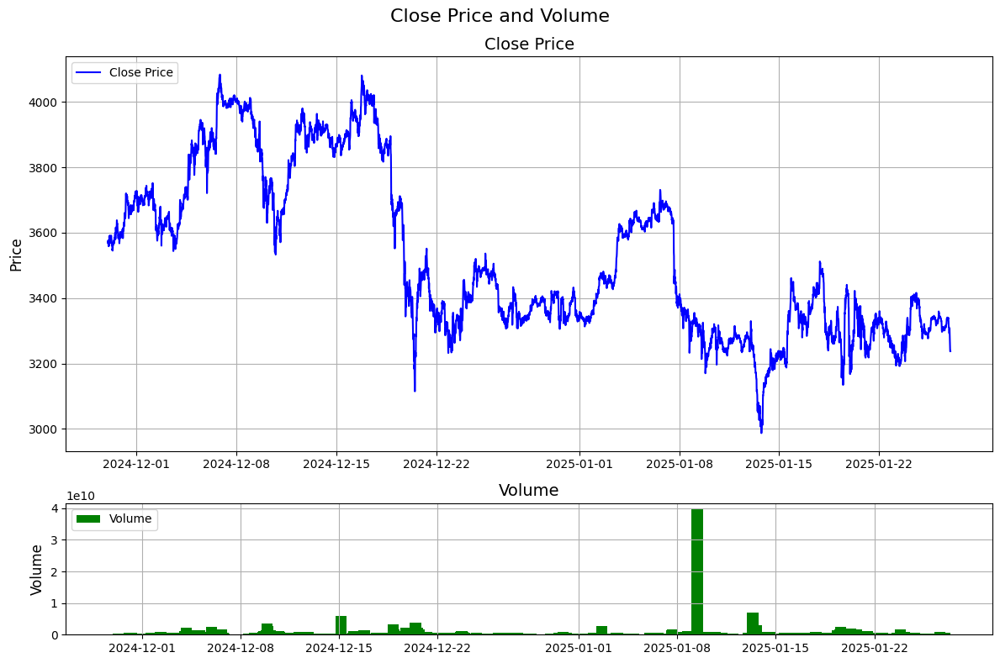

In [8]:
fig, (ax1, ax2) = plt.subplots(
    2, 1,  # 2 строки, 1 столбец
    figsize=(12, 8),  # Размер фигуры
    gridspec_kw={'height_ratios': [3, 1]}
)

# График Close (цена)
ax1.plot(eth_df.index, eth_df['Close'], label='Close Price', color='blue')
ax1.set_title('Close Price', fontsize=14)
ax1.set_ylabel('Price', fontsize=12)
ax1.legend(loc='upper left')
ax1.grid(True)

# График Volume (объем)
ax2.bar(eth_df.index, eth_df['Volume'], label='Volume', color='green')
ax2.set_title('Volume', fontsize=14)
ax2.set_ylabel('Volume', fontsize=12)
ax2.legend(loc='upper left')
ax2.grid(True)

# Настройка общего заголовка
plt.suptitle('Close Price and Volume', fontsize=16)

# Отображение графиков
plt.tight_layout()
plt.show()

# 2. Подготовка данных

In [9]:
def fill_missing_values(data):
    """
    Функция заполняет пропущенные значения в DataFrame предыдущими значениями 
    и удаляет дубликаты по индексу.
    """
    df = data.copy()

    # Проверка и удаление дубликатов по индексу
    if df.index.duplicated().any():
        print("Обнаружены дубликаты по индексу. Они будут удалены.")
        df = df[~df.index.duplicated(keep='first')]
    else:
        print("Дубликатов не обнаружено.")

    # Проверка на наличие пропущенных значений
    if df.isnull().any().any():
        print("Обнаружены пропущенные значения. Выполняется заполнение предыдущими значениями...")
        # Заполняем пропущенные значения предыдущими
        df = df.fillna(method='ffill')
        
        # Если в начале есть NaN, заполняем их последующими значениями
        df = df.fillna(method='bfill')
    else:
        print("Пропущенные значения отсутствуют.")

    return df

In [10]:
# Функция для добавления лагов

def add_lags(data, columns, lags):
    """Функция для добавления лагов

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета лагов
        lags (List): список шагов назад для расчета лагов
    """
    df = data.copy()

    for lag in lags: # Добавляем лаги по шагам назад из lags
        for column in columns:
            new_col_name = f'{column}_lag_{lag}'
            df[new_col_name] = df[column].shift(lag)
    
    return df

In [11]:
# Функция для добавления индикаторов

def add_indicators(data, columns, windows_SMA, windows_RSI):
    """Функция для добавления индикаторов SMA и RSI

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета индикаторов
        windows_SMA (List): список окон для расчета MA
        windows_RSI (List): список окон для расчета RSI
    """
    df = data.copy()

    for window in windows_SMA: # Расчитываем и добавляем SMA по указанным колонкам
        for column in columns:
            new_col_name = f'{column}_SMA_{window}'
            df[new_col_name] = df[column].rolling(window).mean()

    for window in windows_RSI: # Расчитываем и добавляем RSI по указанным колонкам
        for column in columns:
            new_col_name = f'{column}_RSI_{window}'
            df[new_col_name] = talib.RSI(df[column], timeperiod=window)
    
    return df

In [12]:
# Функция для добавления статистик

def add_stats_features(data, columns, windows):
    """Функция для добавления статистик, min, max, std за периоды windows

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета статистик
        windows (List): список окон для расчета статистик
    """   
    df = data.copy()

    for column in columns:
        for window in windows:
            # Скользящее среднее
            df[f'{column}_mean_{window}'] = df[column].rolling(window=window).mean()
            
            # Скользящая медиана
            df[f'{column}_median_{window}'] = df[column].rolling(window=window).median()
            
            # Скользящий минимум
            df[f'{column}_min_{window}'] = df[column].rolling(window=window).min()
            
            # Скользящий максимум
            df[f'{column}_max_{window}'] = df[column].rolling(window=window).max()
            
            # Скользящее стандартное отклонение
            df[f'{column}_std_{window}'] = df[column].rolling(window=window).std()
            
            # Скользящий размах (макс - мин)
            df[f'{column}_range_{window}'] = df[f'{column}_max_{window}'] - df[f'{column}_min_{window}']

    return df

In [13]:
# Функция для добавления разницы между higt и low

def add_hight_low_dif(data):
    df = data.copy()
    df['High-Low'] = df['High'] - df['Low']
    return df

In [14]:
# Функция для добавления трендовых фичей

def add_trend_feat(data, columns, windows):
    """Функция для трендовых фичей

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк трендовых фичей
        windows (List): список окон трендовых фичей
    """   
    df = data.copy()
    for column in columns:
        for window in windows:
            # Отношение текущего значения к предыдущему (лаг = 1)
            df[f'{column}_ratio_1'] = df[column] / df[column].shift(1)
            
            # Логарифмическое изменение (логарифм отношения текущего значения к предыдущему)
            df[f'{column}_log_diff_1'] = np.log(df[column] / df[column].shift(1))
            
            # Momentum (разница между текущим значением и значением N периодов назад)
            df[f'{column}_momentum_{window}'] = df[column] - df[column].shift(window)
            
            # Rate of Change (ROC): процентное изменение за N периодов
            df[f'{column}_roc_{window}'] = (df[column] - df[column].shift(window)) / df[column].shift(window) * 100
    
    return df    

In [15]:
import pickle

# Функция для нормализации данных
def normalize_dataframe(data, scaler="StandardScaler", save_scaler=True, scaler_file="scaler.pkl"):
    """Функция нормализует DataFrame с использованием заданного скейлера.

    Args:
    df (pd.DataFrame): Датафрейм для нормализации.
    scaler (str or sklearn Scaler): Имя скейлера ("StandardScaler", "MinMaxScaler", "RobustScaler") 
                                     или уже обученный объект скейлера.
    save_scaler (bool): сохранять ли scaler в файл (по умолчанию: сохранять)
    scaler_file (str): Имя файла, куда сохраняется обученный скейлер (по умолчанию: "scaler.pkl").

    """
    df = data.copy()

    if isinstance(scaler, str):
        # Создаем скейлер на основе переданного имени
        if scaler == "StandardScaler":
            scaler = StandardScaler()
        elif scaler == "MinMaxScaler":
            scaler = MinMaxScaler()
        elif scaler == "RobustScaler":
            scaler = RobustScaler()
        else:
            raise ValueError(f"Неизвестный скейлер: {scaler}")

        # Обучаем скейлер на датафрейме
        scaler.fit(df)

        # Сохраняем обученный скейлер в файл
        if save_scaler:
            with open(scaler_file, "wb") as f:
                pickle.dump(scaler, f)
    elif hasattr(scaler, "transform"):
        # Если передан обученный скейлер, просто используем его
        pass
    else:
        raise ValueError("Передан некорректный скейлер. Должна быть строка 'StandardScaler', 'MinMaxScaler', 'RobustScaler' или объект sklearn Scaler.")

    # Применяем скейлер к датафрейму
    normalized_data = scaler.transform(df)

    # Возвращаем нормализованный датафрейм и обученный скейлер
    return pd.DataFrame(normalized_data, columns=df.columns, index=df.index), scaler

In [16]:
# Функция для загрузки скейлера из файла
def load_scaler(scaler_file):
    """Загружает скейлер из указанного файла.

    Args:
    scaler_file (str): Путь к файлу, содержащему сохранённый скейлер.

    Return:
    sklearn Scaler: Загруженный объект скейлера.
    """
    with open(scaler_file, "rb") as f:
        scaler = pickle.load(f)
    return scaler

In [17]:
# Функция для добавления номеров месяцев, дней, часов

def add_datetime_features(data, add_month=True, add_weekday=True, add_hour=True):
    """Функция добавляет в DataFrame столбцы с номером месяца, дня недели и часа из индекса Datetime.
    
    Args:
    df (pd.DataFrame): DataFrame с индексом типа Datetime.
    add_month (bool): Добавлять ли столбец с номером месяца (1-12).
    add_weekday (bool): Добавлять ли столбец с номером дня недели (0 - понедельник, 6 - воскресенье).
    add_hour (bool): Добавлять ли столбец с номером часа (0-23).
    """
    df = data.copy()
    
    # Добавляем столбцы по выбору
    if add_month:
        df['Month'] = df.index.month
    if add_weekday:
        df['Weekday'] = df.index.weekday
    if add_hour:
        df['Hour'] = df.index.hour
    
    return df

In [18]:
def prepare_date(data, 
                 lags, 
                 windows_SMA, 
                 windows_RSI, 
                 windows_stats, 
                 windows_trend, 
                 add_month=True, 
                 add_weekday=True, 
                 add_hour=True):
    """
    Функция для добавления фичей и нормализации

    Args:
        data (pd.DataFrame): DataFrame с индексом типа Datetime.
        windows_SMA (List): список окон для индикатора SMA.
        windows_RSI (List): список окон для индикатора RSI.
        windows_stats (List): список окон для статистических фичей.
        windows_trend (List): список окон для трендовых фичей.
        add_month (bool): Добавлять ли столбец с номером месяца (1-12).
        add_weekday (bool): Добавлять ли столбец с номером дня недели (0 - понедельник, 6 - воскресенье).
        add_hour (bool): Добавлять ли столбец с номером часа (0-23).
    """

    df = data.copy()
    columns = df.columns

    df = fill_missing_values(df)
    df = add_lags(df, columns=columns, lags=lags)
    df = add_indicators(df, columns=['Close'], windows_SMA=windows_SMA, windows_RSI=windows_RSI)
    df = add_stats_features(df, columns=['Close'], windows=windows_stats)
    df = add_hight_low_dif(df)
    df = add_trend_feat(df, columns=['Close'], windows=windows_trend)
    df = add_datetime_features(df, add_month=add_month, add_weekday=add_weekday, add_hour=add_hour)
    df = df.dropna()

    return df

In [19]:
eth_df.describe()

,Close,High,Low,Open,Volume
count,5657.000000,5657.000000,5657.000000,5657.000000,5.657000e+03
mean,3524.047411,3530.355923,3517.558992,3524.086901,1.596191e+08
std,250.755005,250.687130,250.928642,250.788751,5.997385e+08
min,2986.886230,3011.861328,2920.592773,2986.638184,0.000000e+00
25%,3326.182129,3332.507324,3319.988281,3326.602539,0.000000e+00
50%,3427.686523,3434.118896,3418.644775,3427.541748,4.274176e+07
75%,3700.130371,3706.196777,3692.436768,3699.854736,2.029896e+08
max,4083.794189,4104.651367,4083.307373,4087.850098,3.963021e+10


In [20]:
eth_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5657 entries, 2024-11-29 00:00:00 to 2025-01-26 23:45:00
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   5657 non-null   float64
 1   High    5657 non-null   float64
 2   Low     5657 non-null   float64
 3   Open    5657 non-null   float64
 4   Volume  5657 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 265.2 KB


In [21]:
window_lag = [3, 9, 15, 30]
window_SMA = [6, 9, 30, 50]
window_RSI = [4, 9, 20]
windows_stats = [3, 10, 30, 50]
windows_trend = [3, 10, 30, 50]

In [22]:
eth_df_features = prepare_date(eth_df, lags=window_lag, windows_SMA=window_SMA, windows_RSI=window_RSI, windows_stats=windows_stats, windows_trend=windows_trend)

Дубликатов не обнаружено.
Пропущенные значения отсутствуют.


In [23]:
eth_df_features.shape

(5607, 70)

## 2.1 Попробуем предсказывать тренд через час. 

In [24]:
def add_target_column(df, close_col='Close', threshold=1):
    """
    Добавляет колонку target в датафрейм на основе процентного изменения цены через час.

    - df: Исходный датафрейм.
    - close_col: Название колонки с ценами закрытия.
    - threshold: Пороговое значение процента для классификации.
    """
    # Рассчитываем процентное изменение цены через час
    df['price_change_pct'] = df[close_col].pct_change(periods=4).shift(-4) * 100

    # Создаем колонку target на основе условий
    df['target'] = np.select(
        [
            df['price_change_pct'] < -threshold,  # Цена упала на threshold и больше
            (df['price_change_pct'] >= -threshold) & (df['price_change_pct'] <= threshold),  # Цена в пределах threshold
            df['price_change_pct'] > threshold  # Цена выросла на threshold и больше
        ],
        [0, 1, 2],  # Соответствующие классы
        default=np.nan  # Если значение NaN (последние 4 строки)
    )

    # Удаляем временную колонку price_change_pct
    df.drop(columns=['price_change_pct'], inplace=True)

    # Удаляем строки с NaN в target (последние 4 строки)
    df.dropna(subset=['target'], inplace=True)

    # Преобразуем target в целые числа
    df['target'] = df['target'].astype(int)

    return df

In [25]:
eth_df_features = add_target_column(eth_df_features, threshold=0.2)

eth_df_features

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-11-29 12:30:00,3580.686035,3592.887207,3580.686035,3591.874023,0,3596.141846,3599.400879,3594.787354,3595.535889,12118016.0,3567.851318,3571.488525,3565.809570,3570.794434,26624.0,3568.648438,3569.625000,3563.303223,3563.750732,0.0,3588.406738,3588.489746,3577.733643,3579.746094,16508928.0,3590.911174,3587.346788,3573.347656,3574.649956,35.245538,49.441738,51.828889,3589.628011,3588.442871,3580.686035,3599.755127,9.589629,19.069092,3585.397241,3585.542847,3567.851318,3599.755127,9.656070,31.903809,3573.347656,3573.491577,3545.072998,3599.755127,14.067701,54.682129,3574.649956,3573.634277,3545.072998,3599.755127,12.995750,54.682129,12.201172,0.997838,-0.002164,-15.455811,-0.429789,7.077637,0.198053,-7.720703,-0.215157,7.513672,0.210280,11,4,12,2
2024-11-29 12:45:00,3588.911621,3588.911621,3579.243896,3581.045166,0,3599.755127,3599.755127,3589.294922,3596.013428,27944960.0,3579.283936,3579.283936,3566.291504,3567.862793,35223552.0,3564.608887,3568.993408,3563.265381,3568.993408,0.0,3591.072754,3594.989502,3587.755615,3594.989502,55717888.0,3591.266602,3588.416531,3573.275618,3575.099985,53.366900,56.335977,54.822300,3586.013509,3588.442871,3580.686035,3588.911621,4.619677,8.225586,3587.503271,3587.610962,3577.063477,3599.755127,7.448303,22.691650,3573.275618,3573.491577,3545.072998,3599.755127,13.979059,54.682129,3575.099985,3574.647339,3545.072998,3599.755127,13.093822,54.682129,9.667725,1.002297,0.002295,-10.843506,-0.301229,21.060303,0.590280,-2.161133,-0.060181,22.501465,0.630928,11,4,12,2
2024-11-29 13:00:00,3615.933350,3615.933350,3588.064209,3588.537842,76015616,3588.442871,3600.627930,3588.442871,3598.555664,39268352.0,3584.306641,3584.399658,3578.810791,3580.911865,44634112.0,3573.660156,3577.802734,3564.117920,3564.117920,18509824.0,3586.899902,3591.191650,3584.968750,3591.191650,15017984.0,3594.978475,3591.930610,3574.243400,3575.890283,79.048478,70.967229,62.813130,3595.177002,3588.911621,3580.686035,3615.933350,18.440026,35.247314,3591.168213,3588.677246,3577.063477,3615.933350,11.083967,38.869873,3574.243400,3573.491577,3545.072998,3615.933350,15.836417,70.860352,3575.890283,3574.647339,3545.072998,3615.933350,14.310947,70.860352,27.869141,1.007529,0.007501,27.490479,0.766084,36.649414,1.023931,29.033447,0.809430,39.514893,1.104873,11,4,13,0
2024-11-29 13:15:00,3607.155273,3613.996094,3601.406738,3613.996094,154284032,3580.686035,3592.887207,3580.686035,3591.874023,0.0,3577.063477,3583.292725,3577.063477,3583.241455,0.0,3575.634521,3575.634521,3571.425049,3573.731201,0.0,3577.485107,3586.071289,3577.485107,3586.071289,503808.0,3596.814046,3595.274143,3575.232406,3576.827256,63.824170,63.224693,59.230703,3604.000081,3607.155273,3588.911621,3615.933350,13.784407,27.021729,3593.453076,3591.286865,3577.063477,3615.933350,11.841489,38.869873,3575.232406,3573.491577,3545.072998,3615.933350,16.934264,70.860352,3576.827256,3576.348999,3545.072998,3615.933350,14.795277,70.860352,12.589355,0.997572,-0.002431,26.469238,0.739223,22.848633,0.637463,29.670166,0.829358,46.848633,1.315859,11,4

In [26]:
print("Количество каждого класса:")
print(eth_df_features['target'].value_counts())

Количество каждого класса:
target
2    1900
0    1864
1    1839
Name: count, dtype: int64


In [27]:
val_size = 400  # Размер валидационной выборки
test_size = 400  # Размер тестовой выборки

# Валидационная выборка
val_df = eth_df_features.iloc[-(val_size + test_size):-test_size]

# Тестовая выборка
test_df = eth_df_features.iloc[-test_size:]

# Обучающая выборка (все остальные данные)
train_df = eth_df_features.iloc[:-(val_size + test_size)]

# Проверка размеров выборок
print(f"Размер обучающей выборки (train): {len(train_df)}")
print(f"Размер валидационной выборки (val): {len(val_df)}")
print(f"Размер тестовой выборки (test): {len(test_df)}")

print("Количество каждого класса в обучающей выборке:")
print(train_df['target'].value_counts())

print("Количество каждого класса в валидационной выборке:")
print(val_df['target'].value_counts())

print("Количество каждого класса в тестовой выборке:")
print(test_df['target'].value_counts())

Размер обучающей выборки (train): 4803
Размер валидационной выборки (val): 400
Размер тестовой выборки (test): 400
Количество каждого класса в обучающей выборке:
target
2    1620
1    1603
0    1580
Name: count, dtype: int64
Количество каждого класса в валидационной выборке:
target
2    160
0    158
1     82
Name: count, dtype: int64
Количество каждого класса в тестовой выборке:
target
1    154
0    126
2    120
Name: count, dtype: int64


In [28]:
# Разделяем данные на фичи и целевую переменную
features_train = train_df.drop(columns=['target'])
target_train = train_df['target']

features_val = val_df.drop(columns=['target'])
target_val = val_df['target']

features_test = test_df.drop(columns=['target'])
target_test = test_df['target']

In [29]:
# нормализация X
X_train_scaled, scaler = normalize_dataframe(features_train, scaler='StandardScaler', save_scaler=True)

# Применение того же scaler к валидационной и тестовой выборкам
X_val_scaled, _ = normalize_dataframe(features_val, scaler=scaler, save_scaler=False)
X_test_scaled, _ = normalize_dataframe(features_test, scaler=scaler, save_scaler=False)

In [30]:
# Создаем новые датафреймы с нормализованными данными
train_scaled_df = pd.DataFrame(X_train_scaled, columns=features_train.columns, index=features_train.index)
val_scaled_df = pd.DataFrame(X_val_scaled, columns=features_val.columns, index=features_val.index)
test_scaled_df = pd.DataFrame(X_test_scaled, columns=features_test.columns, index=features_test.index)

# Добавляем целевую переменную обратно
train_scaled_df['target'] = target_train
val_scaled_df['target'] = target_val
test_scaled_df['target'] = target_test

In [31]:
train_scaled_df

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-11-29 12:30:00,0.079190,0.102891,0.104354,0.123245,-0.242830,0.139641,0.127972,0.159452,0.137048,-0.223753,0.026357,0.016216,0.043462,0.037829,-0.242460,0.028168,0.007505,0.032162,0.008578,-0.241776,0.102997,0.078750,0.085765,0.068417,-0.215051,0.119209,0.104826,0.047131,0.050297,-0.737319,-0.069467,0.154658,0.114390,0.109092,0.108418,0.125568,0.276523,0.332672,0.097007,0.096134,0.110693,0.075925,-0.383503,-0.304692,0.047131,0.044331,0.110401,-0.007064,-0.578925,-0.572704,0.050297,0.042579,0.172267,-0.066672,-0.856647,-0.919988,-0.036477,-0.604762,-0.603373,-0.698704,-0.688643,0.196780,0.189146,-0.086644,-0.093929,0.118561,0.106461,0.552266,0.484180,0.072302,2
2024-11-29 12:45:00,0.111724,0.087171,0.098651,0.080420,-0.242830,0.153937,0.129373,0.137723,0.138937,-0.198992,0.071619,0.047069,0.045370,0.026224,-0.187394,0.012164,0.005004,0.032012,0.029346,-0.241776,0.113582,0.104546,0.125553,0.128927,-0.153697,0.120617,0.109067,0.046844,0.052100,0.131754,0.419285,0.461698,0.100084,0.109092,0.108418,0.082661,-0.454753,-0.500366,0.105358,0.104332,0.147142,0.075925,-0.601345,-0.623232,0.046844,0.044331,0.110401,-0.007064,-0.584484,-0.572704,0.052100,0.046632,0.172267,-0.066672,-0.851747,-0.919988,-0.289984,0.649259,0.650008,-0.487692,-0.481009,0.555655,0.544005,-0.005303,-0.013712,0.292432,0.279293,0.552266,0.484180,0.072302,2
2024-11-29 13:00:00,0.218602,0.194017,0.133534,0.110051,-0.123907,0.109180,0.132825,0.134352,0.148994,-0.181276,0.091504,0.067317,0.094931,0.077879,-0.172671,0.048023,0.039894,0.035389,0.010033,-0.212814,0.097015,0.089473,0.114489,0.113851,-0.217384,0.135320,0.122997,0.050702,0.055267,1.363404,1.456535,1.281333,0.136352,0.110947,0.108418,0.189584,1.578765,1.575542,0.119890,0.108559,0.147142,0.140017,-0.242611,-0.063817,0.050702,0.044331,0.110401,0.057231,-0.468003,-0.260280,0.055267,0.046632,0.172267,-0.002094,-0.790926,-0.672443,1.531323,2.120736,2.113643,1.266075,1.242788,0.955762,0.936343,0.451097,0.436412,0.489802,0.474025,0.552266,0.484180,0.216816,0
2024-11-29 13:15:00,0.183882,0.186357,0.186303,0.210731,-0.001459,0.078490,0.102208,0.103665,0.122562,-0.242711,0.062828,0.062936,0.088013,0.087101,-0.242502,0.055845,0.031307,0.064337,0.048115,-0.241776,0.059638,0.069151,0.084778,0.093526,-0.240095,0.142591,0.136251,0.054644,0.059022,0.633269,0.907645,0.913877,0.171273,0.183140,0.140961,0.189584,0.893740,0.943622,0.128950,0.118904,0.147142,0.140017,-0.167865,-0.063817,0.054644,0.044331,0.110401,0.057231,-0.399154,-0.260280,0.059022,0.053442,0.172267,-0.002094,-0.766724,-0.672443,0.002366,-0.679572,-0.678321,1.219354,1.199405,0.601554,0.586694,0.460412,0.446727,0.574880,0.560713,0.552266,0.484180,0.216816,1
2024-11-29 13:30:00,0.148792,0.170043,0.169878,0.172961,-0.230780,0.111034,0.086483,0.097959,0.079723,-0.242711,0.101293,0.079774,0.082288,0.061953,-0.219224,0.042423,0.035123,0.067592,0.057404,-0.241080,0.043320,0.070161,0.068460,0.064574,-0.240884,0.141619,0.141318,0.057954,0.062220,0.002549,0.412998,0.566333,0.183637,0.183140,0.178040,0.189584,0.164015,0.223645,0.1373

In [32]:
val_scaled_df

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-18 15:00:00,-1.032620,-1.056832,-1.055651,-1.045997,0.152205,-0.987111,-0.991503,-0.968255,-0.993561,0.478611,-1.076173,-1.092699,-1.066801,-1.087726,-0.167801,-1.158068,-1.174532,-1.194766,-1.220061,0.380618,-1.053530,-1.061629,-1.071947,-1.082968,0.493042,-1.013875,-1.016552,-1.099402,-1.004957,-0.266338,0.051986,-0.332564,-1.043439,-1.044117,-1.023197,-1.062166,-0.771900,-0.753775,-1.022911,-1.032406,-0.991153,-1.046437,-0.389891,-0.471572,-1.099402,-1.086664,-1.099850,-1.132996,-0.143267,-0.141931,-1.004957,-1.059012,-1.040178,-0.664441,0.863873,1.464857,-0.035573,0.222331,0.223925,-0.530091,-0.568582,0.361164,0.381159,0.062810,0.056599,-1.834779,-1.889948,-1.359609,0.985693,0.505843,0
2025-01-18 15:15:00,-0.909053,-0.912628,-1.002425,-1.027722,0.061205,-1.053174,-1.011447,-1.035551,-0.987262,-0.242711,-1.057891,-1.073869,-1.089736,-1.080614,-0.153103,-1.021539,-1.045764,-1.144071,-1.153800,0.673373,-1.083978,-1.091056,-1.091016,-1.066900,-0.135462,-1.004379,-1.000324,-1.093900,-1.014507,1.418081,1.174015,0.436679,-0.995722,-1.033951,-1.013868,-0.938547,1.635063,1.465145,-1.006471,-1.011635,-0.972883,-0.989456,-0.174167,-0.133894,-1.093900,-1.086534,-1.099850,-1.075834,-0.045826,0.135830,-1.014507,-1.059012,-1.040178,-0.679492,0.648317,1.407164,2.267072,2.666066,2.654137,1.663079,1.778509,1.079253,1.150331,0.632102,0.668977,-1.351086,-1.399180,-1.359609,0.985693,0.505843,0
2025-01-18 15:30:00,-0.926183,-0.905446,-0.911534,-0.925029,-0.069288,-1.043845,-1.042233,-1.034575,-1.059878,-0.242711,-1.025701,-1.049936,-1.044982,-1.066640,0.573598,-0.986222,-0.983181,-0.980000,-0.983744,0.202569,-1.135606,-1.142556,-1.198191,-1.118410,0.073128,-0.993532,-0.989585,-1.087246,-1.024103,1.011644,0.945599,0.323260,-0.956830,-0.927463,-1.003704,-0.938547,1.355994,1.267778,-0.993580,-0.993318,-0.970212,-0.989456,-0.129173,-0.157236,-1.087246,-1.080379,-1.099850,-1.075834,0.017639,0.135830,-1.024103,-1.059012,-1.040178,-0.786854,0.412740,0.995613,0.149140,-0.362499,-0.360798,1.357072,1.449586,0.849583,0.902952,0.759003,0.808590,-1.357586,-1.407413,-1.359609,0.985693,0.505843,0
2025-01-18 15:45:00,-0.995022,-0.907527,-0.969766,-0.916031,0.048969,-1.033681,-1.057882,-1.056705,-1.047047,0.152333,-0.974937,-0.999187,-0.990476,-1.015802,-0.060638,-0.988308,-0.988123,-0.976873,-0.990222,0.476066,-1.147800,-1.157610,-1.183355,-1.133466,0.188984,-0.995027,-0.992159,-1.082497,-1.032938,-0.231839,0.138175,-0.109704,-0.944289,-0.927463,-0.966096,-0.938547,0.558253,0.537504,-0.990813,-0.993318,-0.970212,-0.989456,-0.161468,-0.157236,-1.082497,-1.071428,-1.099850,-1.075834,0.023704,0.135830,-1.032938,-1.059012,-1.040178,-0.911590,0.232144,0.517463,1.569849,-1.468317,-1.469747,0.443285,0.470793,0.194198,0.201122,0.549297,0.582680,-1.247469,-1.304582,-1.359609,0.985693,0.505843,0
2025-01-18 16:00:00,-1.073693,-1.011443,-1.048431,-1.010893,0.538320,-0.910074,-0.913632,-1.003462,-1.028766,0.061330,-0.968971,-0.993223,-0.977839,-0.975028,-0.201149,-1.077805,-1.011582,-1.052575,-0.990494,-0.151420,-1.122390,-1.136079,

In [33]:
test_scaled_df

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-22 19:00:00,-1.186273,-1.210439,-1.197052,-1.222080,-0.199983,-1.168076,-1.124010,-1.146822,-1.099842,0.011321,-1.123850,-1.145489,-1.117134,-1.142454,-0.237449,-1.116214,-1.057578,-1.090982,-1.047360,-0.241776,-0.986626,-1.010863,-0.989543,-1.014739,-0.240884,-1.155535,-1.142169,-1.086390,-1.078351,-0.491855,-0.795600,-0.996041,-1.188791,-1.187678,-1.204444,-1.173294,0.532833,0.608063,-1.140770,-1.131451,-1.151470,-1.170831,-0.172124,-0.156248,-1.086390,-1.106722,-1.062656,-1.084714,-0.233244,-0.088698,-1.078351,-1.072337,-1.002916,-1.149047,-0.668389,-0.536492,-0.345220,1.032522,1.031963,-0.214858,-0.235844,-0.276758,-0.304486,-0.752125,-0.813598,-0.525627,-0.576182,-1.359609,-0.518846,1.083897,1
2025-01-22 19:15:00,-1.157333,-1.151729,-1.159875,-1.185163,-0.232148,-1.144798,-1.148600,-1.119507,-1.142655,-0.242711,-1.135401,-1.118781,-1.110112,-1.121851,-0.174273,-1.111727,-1.130994,-1.124132,-1.126139,-0.203441,-0.928469,-0.952724,-0.958138,-0.980729,0.232606,-1.166751,-1.144966,-1.094434,-1.081634,0.024337,-0.391283,-0.701200,-1.193338,-1.187678,-1.204444,-1.186932,0.291878,0.343288,-1.144446,-1.142992,-1.151470,-1.170831,-0.171466,-0.156248,-1.094434,-1.109825,-1.062656,-1.110962,-0.304504,-0.216244,-1.081634,-1.077942,-1.002916,-1.149047,-0.658350,-0.536492,0.199905,0.634255,0.635045,-0.149283,-0.164648,-0.222770,-0.245917,-0.859401,-0.923962,-0.443741,-0.488490,-1.359609,-0.518846,1.083897,1
2025-01-22 19:30:00,-1.118879,-1.142200,-1.138421,-1.158283,0.236336,-1.234429,-1.164502,-1.230453,-1.143667,-0.131501,-1.103975,-1.124359,-1.098091,-1.123412,-0.242502,-1.101585,-1.114545,-1.104376,-1.114885,-0.241776,-0.954690,-0.953821,-0.934849,-0.941593,-0.240884,-1.170068,-1.146977,-1.100309,-1.084114,0.592237,0.089080,-0.333639,-1.155172,-1.158725,-1.157400,-1.148461,0.123228,0.176718,-1.143109,-1.136310,-1.151470,-1.170831,-0.160185,-0.156248,-1.100309,-1.111550,-1.062656,-1.129296,-0.377588,-0.305329,-1.084114,-1.084161,-1.002916,-1.149047,-0.660932,-0.536492,-0.101753,0.839879,0.840042,1.331918,1.443665,0.101649,0.103106,-0.620523,-0.671432,-0.327659,-0.364277,-1.359609,-0.518846,1.083897,0
2025-01-22 19:45:00,-1.183944,-1.159893,-1.158673,-1.152434,-0.184062,-1.187383,-1.211537,-1.198150,-1.223186,-0.199863,-1.098736,-1.117379,-1.096720,-1.103296,-0.210512,-1.171166,-1.134439,-1.152148,-1.110308,-0.231608,-0.977726,-0.980045,-0.961142,-0.955868,0.027458,-1.172901,-1.156818,-1.107598,-1.087254,-0.475067,-0.605865,-0.823537,-1.154395,-1.158725,-1.155071,-1.148461,0.082430,0.131497,-1.151442,-1.155581,-1.151470,-1.170831,-0.164966,-0.156248,-1.107598,-1.113822,-1.062656,-1.129296,-0.406664,-0.305329,-1.087254,-1.092282,-1.002916,-1.149047,-0.637057,-0.536492,-0.037112,-1.408323,-1.409471,0.035324,0.034656,-0.524292,-0.569343,-0.776310,-0.838839,-0.423168,-0.467723,-1.359609,-0.518846,1.083897,1
2025-01-22 20:00:00,-1.186020,-1.182012,-1.160748,-1.178623,-0.193165,-1.158435,-1.152808,-1.160961,-1.186258,-0.232029,-1.093284,-1.112866,-1.085451,-1.110772,-0.242502,-1.129646,-1.153840,-1.

In [34]:
# Функция для создания окон
def create_windows(data, window_size=30, target_col='target'):
    X, y = [], []
    for i in range(window_size, len(data)):
        X.append(data.iloc[i-window_size:i].drop(columns=[target_col]).values)  # Окно фичей
        y.append(data.iloc[i - 1][target_col])  # Целевая переменная (значение таргета в последней строке окна)
    return np.array(X), np.array(y)

In [60]:
# Создаем окна для train, validation и test
window_size = 30
X_train, y_train = create_windows(train_scaled_df, window_size=window_size)
X_val, y_val = create_windows(val_scaled_df, window_size=window_size)
X_test, y_test = create_windows(test_scaled_df, window_size=window_size)

# Проверяем размерности
print(X_train.shape, X_val.shape, X_test.shape)
print(y_train.shape, y_val.shape, y_test.shape)

(4773, 30, 70) (370, 30, 70) (370, 30, 70)
(4773,) (370,) (370,)


In [36]:
# Преобразование в тензоры PyTorch
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

In [37]:
num_classes = 3

# Преобразование в one-hot
y_train_one_hot = F.one_hot(y_train_tensor, num_classes=num_classes)
y_val_one_hot = F.one_hot(y_val_tensor, num_classes=num_classes)
y_test_one_hot = F.one_hot(y_test_tensor, num_classes=num_classes)

y_train_one_hot = y_train_one_hot.float()
y_val_one_hot = y_val_one_hot.float()
y_test_one_hot = y_test_one_hot.float()

print("y_train one-hot:\n", y_train_one_hot)
print("y_val one-hot:\n", y_val_one_hot)
print("y_test one-hot:\n", y_test_one_hot)

y_train one-hot:
 tensor([[0., 0., 1.],
        [0., 0., 1.],
        [1., 0., 0.],
        ...,
        [1., 0., 0.],
        [0., 0., 1.],
        [0., 0., 1.]])
y_val one-hot:
 tensor([[0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        ...,
        [1., 0., 0.],
        [0., 1., 0.],
        [0., 1., 0.]])
y_test one-hot:
 tensor([[0., 0., 1.],
        [0., 0., 1.],
        [0., 1., 0.],
        ...,
        [1., 0., 0.],
        [1., 0., 0.],
        [1., 0., 0.]])


In [38]:
# Преобразование в тензоры PyTorch
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

In [39]:
# Проверяем размерности
print(X_train_tensor.shape, X_val_tensor.shape, X_test_tensor.shape)
print(y_train_one_hot.shape, y_val_one_hot.shape, y_test_one_hot.shape)

torch.Size([4773, 30, 70]) torch.Size([370, 30, 70]) torch.Size([370, 30, 70])
torch.Size([4773, 3]) torch.Size([370, 3]) torch.Size([370, 3])


In [40]:
# Создание TensorDataset для train, val и test
train_dataset = TensorDataset(X_train_tensor, y_train_one_hot)
val_dataset = TensorDataset(X_val_tensor, y_val_one_hot)
test_dataset = TensorDataset(X_test_tensor, y_test_one_hot)

batch_size = 32  # Размер мини-батча

# Создание DataLoader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# 3. Обучение нейросети

In [41]:
from sklearn.metrics import classification_report, roc_auc_score

# Функция для вывода метрик
def evaluate_model(y_true, y_pred, y_prob, name):
    print(f"\n=== Метрики для {name} выборки ===")
    
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=['Class 0', 'Class 1', 'Class 2']))
    
    # ROC AUC (для многоклассовой классификации)
    roc_auc = roc_auc_score(y_true, y_prob, multi_class='ovr', average='macro')
    print(f"ROC AUC (OvR, macro): {roc_auc:.4f}")

In [42]:
def get_predictions(model, dataloader, device):
    '''Функция для получения предсказаний и вероятностей'''
    
    model.eval()  # Переводим модель в режим оценки
    y_true = []
    y_pred = []
    y_prob = []
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in dataloader:
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(features)
            
            # Получаем предсказанные классы
            _, predicted = torch.max(outputs, 1)
            
            # Получаем вероятности классов
            prob = torch.softmax(outputs, dim=1)
            
            # Сохраняем результаты
            y_true.extend(torch.argmax(labels, dim=1).cpu().numpy())  # Преобразуем one-hot в индексы классов
            y_pred.extend(predicted.cpu().numpy())
            y_prob.extend(prob.cpu().numpy())
    
    return np.array(y_true), np.array(y_pred), np.array(y_prob)

In [43]:
# Проверка доступности CUDA
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [44]:
def train_model(
    model,  # Модель
    train_loader,  # DataLoader для обучающей выборки
    val_loader,  # DataLoader для валидационной выборки
    criterion,  # Функция потерь
    optimizer,  # Оптимизатор
    scheduler,  # Шедулер
    num_epochs,  # Количество эпох
    device,  # Устройство (CPU или GPU)
    name_model,  # Название модели для сохранения весов
):
    # Инициализация переменных для сохранения лучших моделей
    best_train_accuracy = 0.0
    best_val_accuracy = 0.0
    best_val_loss = float("inf")

    # Цикл обучения
    for epoch in range(num_epochs):
        model.train()  # Переводим модель в режим обучения

        train_loss = 0.0
        train_correct = 0
        train_total = 0

        # Обучение на обучающей выборке
        for batch_idx, batch in enumerate(train_loader):
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы

            # Backward pass и оптимизация
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Считаем loss и accuracy
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

        # Валидация
        model.eval()  # Переводим модель в режим оценки
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():  # Отключаем вычисление градиентов
            for batch in val_loader:
                # Перемещаем батч на устройство (GPU или CPU)
                features, labels = batch
                features = features.to(device)
                labels = labels.to(device)

                # Forward pass
                outputs = model(features)
                loss = criterion(outputs, torch.argmax(labels, dim=1))

                # Считаем loss и accuracy
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

        # Вычисляем средние loss и accuracy
        train_loss /= len(train_loader)
        val_loss /= len(val_loader)
        train_accuracy = 100 * train_correct / train_total
        val_accuracy = 100 * val_correct / val_total

        # Вывод логов
        print(
            f"Epoch [{epoch + 1}/{num_epochs}], "
            f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
            f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%"
        )

        # Обновление шедулера
        scheduler.step(val_loss)

        # Сохранение лучшей модели по train accuracy
        if train_accuracy > best_train_accuracy:
            best_train_accuracy = train_accuracy
            torch.save(model.state_dict(), f'{name_model}_train_best_acc.pth')
            print(f"Best train model saved with Train Accuracy: {train_accuracy:.2f}%")

        # Сохранение лучшей модели по val accuracy
        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            torch.save(model.state_dict(), f'{name_model}_val_best_acc.pth')
            print(f"Best val model saved with Val Accuracy: {val_accuracy:.2f}%")

        
        # Сохранение лучшей модели по val loss
        # if val_loss < best_val_loss:
        #     best_val_loss = val_loss
        #     print(f"Best val loss: {val_loss:.4f}")

    print("Training complete!")

## 3.1 CONV

In [77]:
class ConvClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(ConvClassifier, self).__init__()

        # Conv1d слои
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=3, padding=1)

        # Max pooling слои
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)

        # Полносвязный слой для классификации
        self.fc1 = nn.LazyLinear(hidden_size)
        self.fc2 = nn.Linear(hidden_size, num_classes)

        # Слой Flatten для преобразования многомерного тензора в одномерный
        self.flatten = nn.Flatten()

        # Активационная функция ReLU и Dropout для регуляризации
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)


    def forward(self, x):
        x = x.permute(0, 2, 1)  # Переставляем размерности для Conv1d: (batch_size, window_size, num_features) -> (batch_size, num_features, window_size)

        # Применяем Conv1d слои с ReLU и MaxPooling
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = self.relu(self.conv3(x))
        x = self.pool(x)
        
        x = self.flatten(x)

        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

In [78]:
# Параметры модели
input_size = X_train.shape[2]  # Количество фичей (num_features)
num_classes = 3  # Количество классов
hidden_size = 200  # Размер скрытого состояния LSTM

# Инициализация модели
model_conv = ConvClassifier(input_size=input_size, hidden_size=hidden_size, num_classes=num_classes)
model_conv.to(device)  # Перемещаем модель на устройство

ConvClassifier(
  (conv1): Conv1d(70, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv3): Conv1d(128, 256, kernel_size=(3,), stride=(1,), padding=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): LazyLinear(in_features=0, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=3, bias=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [200]:
# Гиперпараметры
learning_rate = 0.01
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_conv.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

# Цикл обучения
best_val_loss = float('inf')  # Лучший валидационный loss
for epoch in range(num_epochs):
    model_conv.train()  # Переводим модель в режим обучения

    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    # Обучение на обучающей выборке
    for batch_idx, batch in enumerate(train_loader):
        # Перемещаем батч на устройство (GPU или CPU)
        features, labels = batch
        features = features.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model_conv(features)
        loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы
        
        # Backward pass и оптимизация
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Считаем loss и accuracy
        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Валидация
    model_conv.eval()  # Переводим модель в режим оценки
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in val_loader:
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model_conv(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))
            
            # Считаем loss и accuracy
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Вычисляем средние loss и accuracy
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    train_accuracy = 100 * train_correct / train_total
    val_accuracy = 100 * val_correct / val_total
    
    # Вывод логов
    print(f"Epoch [{epoch + 1}/{num_epochs}], "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
    
    # Обновление шедулера
    scheduler.step(val_loss)
    
    # Сохранение лучшей модели
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_conv.state_dict(), 'best_model_conv.pth')  # Сохраняем веса модели
        print(f"Best model saved with Val Loss: {val_loss:.4f}")

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1022, Train Accuracy: 33.80%, Val Loss: 1.1145, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1145
Epoch [2/100], Train Loss: 1.1023, Train Accuracy: 32.88%, Val Loss: 1.1140, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1140
Epoch [3/100], Train Loss: 1.1023, Train Accuracy: 32.65%, Val Loss: 1.1138, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1138
Epoch [4/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1138, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1138
Epoch [5/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [6/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [7/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [8/100], Train Loss: 1.1022, Train 

In [201]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(model_conv, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(model_conv, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(model_conv, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1579
     Class 1       0.00      0.00      0.00      1602
     Class 2       0.34      1.00      0.50      1612

    accuracy                           0.34      4793
   macro avg       0.11      0.33      0.17      4793
weighted avg       0.11      0.34      0.17      4793

ROC AUC (OvR, macro): 0.5000

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00       151
     Class 1       0.00      0.00      0.00        80
     Class 2       0.41      1.00      0.58       159

    accuracy                           0.41       390
   macro avg       0.14      0.33      0.19       390
weighted avg       0.17      0.41      0.24       390

ROC AUC (OvR, macro): 0.5000

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

## 3.1 Conv + LSTM

In [81]:
class ConvLstmClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_lstm_layers, num_classes):
        super(ConvLstmClassifier, self).__init__()

        # Conv1d слои
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, padding=1)

        # Max pooling слои
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)

        # LSTM слои
        self.lstm = nn.LSTM(input_size=128, hidden_size=hidden_size, num_layers=num_lstm_layers, batch_first=True)

        # Полносвязный слой для классификации
        self.fc1 = nn.Linear(hidden_size, 100)
        self.fc2 = nn.Linear(100, num_classes)

        # Активационная функция ReLU и Dropout для регуляризации
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)


    def forward(self, x):
        x = x.permute(0, 2, 1)  # Переставляем размерности для Conv1d: (batch_size, window_size, num_features) -> (batch_size, num_features, window_size)

        # Применяем Conv1d слои с ReLU и MaxPooling
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = self.relu(self.conv3(x))
        x = self.pool(x)

        # Перестановка размерностей для LSTM: (batch_size, new_window_size, num_channels)
        x = x.permute(0, 2, 1) 

        x, _ = self.lstm(x)
        x = x[:, -1, :]

        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

In [82]:
# Параметры модели
input_size = X_train.shape[2]  # Количество фичей (num_features)
num_classes = 3  # Количество классов
hidden_size = 128  # Размер скрытого состояния LSTM
num_lstm_layers = 5  # Количество слоев LSTM

# Инициализация модели
model_conv_lstm = ConvLstmClassifier(input_size=input_size, hidden_size=hidden_size, num_lstm_layers=num_lstm_layers, num_classes=num_classes)
model_conv_lstm.to(device)  # Перемещаем модель на устройство

ConvLstmClassifier(
  (conv1): Conv1d(70, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv3): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (lstm): LSTM(128, 128, num_layers=5, batch_first=True)
  (fc1): Linear(in_features=128, out_features=100, bias=True)
  (fc2): Linear(in_features=100, out_features=3, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [83]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_conv_lstm.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

# Цикл обучения
best_val_loss = float('inf')  # Лучший валидационный loss
for epoch in range(num_epochs):
    model_conv_lstm.train()  # Переводим модель в режим обучения

    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    # Обучение на обучающей выборке
    for batch_idx, batch in enumerate(train_loader):
        # Перемещаем батч на устройство (GPU или CPU)
        features, labels = batch
        features = features.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model_conv_lstm(features)
        loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы
        
        # Backward pass и оптимизация
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Считаем loss и accuracy
        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Валидация
    model_conv_lstm.eval()  # Переводим модель в режим оценки
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in val_loader:
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model_conv_lstm(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))
            
            # Считаем loss и accuracy
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Вычисляем средние loss и accuracy
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    train_accuracy = 100 * train_correct / train_total
    val_accuracy = 100 * val_correct / val_total
    
    # Вывод логов
    print(f"Epoch [{epoch + 1}/{num_epochs}], "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
    
    # Обновление шедулера
    scheduler.step(val_loss)
    
    # Сохранение лучшей модели
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_conv_lstm.state_dict(), 'best_model_convlstm.pth')  # Сохраняем веса модели
        print(f"Best model saved with Val Loss: {val_loss:.4f}")

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1013, Train Accuracy: 31.88%, Val Loss: 1.1088, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1088
Epoch [2/100], Train Loss: 1.1009, Train Accuracy: 32.42%, Val Loss: 1.1104, Val Accuracy: 20.51%
Epoch [3/100], Train Loss: 1.1011, Train Accuracy: 31.40%, Val Loss: 1.1046, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1046
Epoch [4/100], Train Loss: 1.1008, Train Accuracy: 33.49%, Val Loss: 1.1098, Val Accuracy: 20.51%
Epoch [5/100], Train Loss: 1.1001, Train Accuracy: 31.96%, Val Loss: 1.1062, Val Accuracy: 20.51%
Epoch [6/100], Train Loss: 1.0997, Train Accuracy: 32.17%, Val Loss: 1.1050, Val Accuracy: 20.51%
Epoch [7/100], Train Loss: 1.0997, Train Accuracy: 32.57%, Val Loss: 1.1049, Val Accuracy: 20.51%
Epoch [8/100], Train Loss: 1.0997, Train Accuracy: 32.36%, Val Loss: 1.1045, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1045
Epoch [9/100], Train Loss: 1.0999, Train Accuracy: 32.01%, Val Loss: 1.1045, Val Accuracy: 20.51%
B

In [84]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(model_conv_lstm, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(model_conv_lstm, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(model_conv_lstm, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1579
     Class 1       0.00      0.00      0.00      1602
     Class 2       0.34      1.00      0.50      1612

    accuracy                           0.34      4793
   macro avg       0.11      0.33      0.17      4793
weighted avg       0.11      0.34      0.17      4793

ROC AUC (OvR, macro): 0.5000

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00       151
     Class 1       0.00      0.00      0.00        80
     Class 2       0.41      1.00      0.58       159

    accuracy                           0.41       390
   macro avg       0.14      0.33      0.19       390
weighted avg       0.17      0.41      0.24       390

ROC AUC (OvR, macro): 0.5000

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

Простые модели не могут уловить зависимости и учатся предсказывать только один класс. Попробуем более сложные модели.

## 3.2 TSMixer

### 3.2.1 TSmixer Linnear

In [427]:
class ResidualBlock(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlock, self).__init__()
        
        # Time mixing (работаем с фичами)
        self.norm1 = nn.LayerNorm((input_shape[0], input_shape[-1]))
        self.dense1 = nn.Linear(input_shape[0], input_shape[0])  # Фичи -> Фичи
        self.dropout1 = nn.Dropout(dropout_rate)
        
        # Feature mixing (работаем с фичами)
        self.norm2 = nn.LayerNorm((input_shape[0], input_shape[-1]))
        self.dense2 = nn.Linear(input_shape[-1], ff_dim)  # Фичи -> FF_Dim
        self.dense3 = nn.Linear(ff_dim, input_shape[-1])  # FF_Dim -> Фичи
        self.dropout2 = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        # x shape: [Batch, Input Length (30), Features (70)]
        
        # Time mixing
        residual = x
        x = self.norm1(x)  # Нормализация по фичам (70)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.dense1(x)  # [Batch, 70, 30] -> [Batch, 70, 30]
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual
        
        # Feature mixing
        residual = x
        x = self.norm2(x)  # Нормализация по фичам (70)
        x = self.dense2(x)  # [Batch, 30, 70] -> [Batch, 30, FF_Dim]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.dense3(x)  # [Batch, 30, FF_Dim] -> [Batch, 30, 70]
        x = self.dropout2(x)
        x = x + residual
        
        return x

In [428]:
class TSMixerClassifier(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifier, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlock(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [429]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.5  # Коэффициент dropout

# Инициализация модели
tsmixer_model = TSMixerClassifier(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model.to(device) 

TSMixerClassifier(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlock(
      (norm1): LayerNorm((30, 89), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=30, bias=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (norm2): LayerNorm((30, 89), eps=1e-05, elementwise_affine=True)
      (dense2): Linear(in_features=89, out_features=64, bias=True)
      (dense3): Linear(in_features=64, out_features=89, bias=True)
      (dropout2): Dropout(p=0.5, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=89, out_features=3, bias=True)
)

In [430]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1301, Train Accuracy: 35.99%, Val Loss: 1.0848, Val Accuracy: 39.46%
Best train model saved with Train Accuracy: 35.99%
Best val model saved with Val Accuracy: 39.46%
Epoch [2/100], Train Loss: 1.0973, Train Accuracy: 37.50%, Val Loss: 1.0596, Val Accuracy: 42.70%
Best train model saved with Train Accuracy: 37.50%
Best val model saved with Val Accuracy: 42.70%
Epoch [3/100], Train Loss: 1.0900, Train Accuracy: 37.88%, Val Loss: 1.0563, Val Accuracy: 42.16%
Best train model saved with Train Accuracy: 37.88%
Epoch [4/100], Train Loss: 1.0848, Train Accuracy: 39.02%, Val Loss: 1.0540, Val Accuracy: 41.89%
Best train model saved with Train Accuracy: 39.02%
Epoch [5/100], Train Loss: 1.0798, Train Accuracy: 40.29%, Val Loss: 1.0509, Val Accuracy: 43.51%
Best train model saved with Train Accuracy: 40.29%
Best val model saved with Val Accuracy: 43.51%
Epoch [6/100], Train Loss: 1.0762, Train Accuracy: 40.57%, Val Loss: 1.0499, Val Accuracy: 44.05%
Best train model

In [431]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.52      0.55      0.53      1556
     Class 1       0.56      0.41      0.47      1584
     Class 2       0.51      0.61      0.55      1583

    accuracy                           0.52      4723
   macro avg       0.53      0.52      0.52      4723
weighted avg       0.53      0.52      0.52      4723

ROC AUC (OvR, macro): 0.7096

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.45      0.20      0.27       148
     Class 1       0.23      0.17      0.19        72
     Class 2       0.43      0.73      0.55       150

    accuracy                           0.41       370
   macro avg       0.37      0.37      0.34       370
weighted avg       0.40      0.41      0.37       370

ROC AUC (OvR, macro): 0.5862

=== Метрики для тестовой выборки ===

Classificat

In [433]:
# Усилим модель
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 4  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.5  # Коэффициент dropout

# Инициализация модели
tsmixer_model_2 = TSMixerClassifier(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_2.to(device) 

TSMixerClassifier(
  (blocks): ModuleList(
    (0-3): 4 x ResidualBlock(
      (norm1): LayerNorm((30, 89), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=30, bias=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (norm2): LayerNorm((30, 89), eps=1e-05, elementwise_affine=True)
      (dense2): Linear(in_features=89, out_features=64, bias=True)
      (dense3): Linear(in_features=64, out_features=89, bias=True)
      (dropout2): Dropout(p=0.5, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=89, out_features=3, bias=True)
)

In [434]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_2')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1465, Train Accuracy: 35.55%, Val Loss: 1.0598, Val Accuracy: 41.62%
Best train model saved with Train Accuracy: 35.55%
Best val model saved with Val Accuracy: 41.62%
Epoch [2/100], Train Loss: 1.1005, Train Accuracy: 38.83%, Val Loss: 1.0680, Val Accuracy: 37.30%
Best train model saved with Train Accuracy: 38.83%
Epoch [3/100], Train Loss: 1.0919, Train Accuracy: 39.19%, Val Loss: 1.0669, Val Accuracy: 38.11%
Best train model saved with Train Accuracy: 39.19%
Epoch [4/100], Train Loss: 1.0830, Train Accuracy: 39.76%, Val Loss: 1.0587, Val Accuracy: 42.43%
Best train model saved with Train Accuracy: 39.76%
Best val model saved with Val Accuracy: 42.43%
Epoch [5/100], Train Loss: 1.0809, Train Accuracy: 40.00%, Val Loss: 1.0620, Val Accuracy: 40.54%
Best train model saved with Train Accuracy: 40.00%
Epoch [6/100], Train Loss: 1.0773, Train Accuracy: 40.06%, Val Loss: 1.0601, Val Accuracy: 41.08%
Best train model saved with Train Accuracy: 40.06%
Epoch [7/100

In [435]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.44      0.43      0.43      1556
     Class 1       0.45      0.56      0.50      1584
     Class 2       0.50      0.38      0.43      1583

    accuracy                           0.46      4723
   macro avg       0.46      0.46      0.45      4723
weighted avg       0.46      0.46      0.45      4723

ROC AUC (OvR, macro): 0.6466

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.44      0.20      0.28       148
     Class 1       0.24      0.39      0.30        72
     Class 2       0.45      0.55      0.49       150

    accuracy                           0.38       370
   macro avg       0.38      0.38      0.36       370
weighted avg       0.40      0.38      0.37       370

ROC AUC (OvR, macro): 0.5637

=== Метрики для тестовой выборки ===

Classificat

### 3.2.2 TSmixer with Conv1D

In [436]:
class ResidualBlockConv(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlockConv, self).__init__()
        seq_len, num_features = input_shape  # 30 и 70
        
        # Time mixing
        self.norm1 = nn.LayerNorm(num_features)
        self.conv1 = nn.Conv1d(
            in_channels=num_features,  # 70
            out_channels=num_features,  # 70
            kernel_size=3,
            padding=1
        )
        self.dropout1 = nn.Dropout(dropout_rate)
        
        # Feature mixing
        self.norm2 = nn.LayerNorm(num_features)
        self.conv2 = nn.Conv1d(
            in_channels=num_features,  # 70 вместо seq_len!
            out_channels=ff_dim,       # 64
            kernel_size=3,
            padding=1
        )
        self.conv3 = nn.Conv1d(
            in_channels=ff_dim,        # 64
            out_channels=num_features, # 70 вместо seq_len!
            kernel_size=3,
            padding=1
        )
        self.dropout2 = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Time mixing
        residual = x
        x = self.norm1(x)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.conv1(x)
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x += residual
        
        # Feature mixing
        residual = x
        x = self.norm2(x)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.conv2(x)  # [70, 64]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.conv3(x)  # [64, 70]
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x += residual
        
        return x

In [437]:
class TSMixerClassifierConv(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifierConv, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlockConv(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [ ]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 1  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_model_conv = TSMixerClassifierConv(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_conv.to(device) 

TSMixerClassifierConv(
  (blocks): ModuleList(
    (0): ResidualBlockConv(
      (norm1): LayerNorm((89,), eps=1e-05, elementwise_affine=True)
      (conv1): Conv1d(89, 89, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((89,), eps=1e-05, elementwise_affine=True)
      (conv2): Conv1d(89, 128, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv3): Conv1d(128, 89, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=89, out_features=3, bias=True)
)

In [443]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_conv.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_conv, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_conv')

Epoch [1/100], Train Loss: 1.2008, Train Accuracy: 34.00%, Val Loss: 1.1030, Val Accuracy: 40.81%
Best train model saved with Train Accuracy: 34.00%
Best val model saved with Val Accuracy: 40.81%
Epoch [2/100], Train Loss: 1.1141, Train Accuracy: 36.08%, Val Loss: 1.0691, Val Accuracy: 42.16%
Best train model saved with Train Accuracy: 36.08%
Best val model saved with Val Accuracy: 42.16%
Epoch [3/100], Train Loss: 1.1214, Train Accuracy: 35.99%, Val Loss: 1.0710, Val Accuracy: 40.00%
Epoch [4/100], Train Loss: 1.0915, Train Accuracy: 38.45%, Val Loss: 1.0671, Val Accuracy: 42.97%
Best train model saved with Train Accuracy: 38.45%
Best val model saved with Val Accuracy: 42.97%
Epoch [5/100], Train Loss: 1.0860, Train Accuracy: 39.36%, Val Loss: 1.0874, Val Accuracy: 40.27%
Best train model saved with Train Accuracy: 39.36%
Epoch [6/100], Train Loss: 1.0804, Train Accuracy: 39.97%, Val Loss: 1.0645, Val Accuracy: 42.97%
Best train model saved with Train Accuracy: 39.97%
Epoch [7/100], T

In [444]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_conv, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_conv, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_conv, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.50      0.44      0.47      1556
     Class 1       0.48      0.53      0.50      1584
     Class 2       0.47      0.49      0.48      1583

    accuracy                           0.49      4723
   macro avg       0.49      0.48      0.48      4723
weighted avg       0.49      0.49      0.48      4723

ROC AUC (OvR, macro): 0.6593

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.19      0.07      0.10       148
     Class 1       0.26      0.31      0.28        72
     Class 2       0.39      0.61      0.48       150

    accuracy                           0.33       370
   macro avg       0.28      0.33      0.28       370
weighted avg       0.29      0.33      0.29       370

ROC AUC (OvR, macro): 0.5171

=== Метрики для тестовой выборки ===

Classificat

In [445]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_model_conv_2 = TSMixerClassifierConv(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_conv_2.to(device) 

TSMixerClassifierConv(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlockConv(
      (norm1): LayerNorm((89,), eps=1e-05, elementwise_affine=True)
      (conv1): Conv1d(89, 89, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((89,), eps=1e-05, elementwise_affine=True)
      (conv2): Conv1d(89, 64, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv3): Conv1d(64, 89, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=89, out_features=3, bias=True)
)

In [446]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_conv_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_conv_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_conv_2')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.2019, Train Accuracy: 35.25%, Val Loss: 1.0654, Val Accuracy: 43.51%
Best train model saved with Train Accuracy: 35.25%
Best val model saved with Val Accuracy: 43.51%
Epoch [2/100], Train Loss: 1.1257, Train Accuracy: 36.54%, Val Loss: 1.1571, Val Accuracy: 40.54%
Best train model saved with Train Accuracy: 36.54%
Epoch [3/100], Train Loss: 1.1084, Train Accuracy: 37.10%, Val Loss: 1.0785, Val Accuracy: 41.89%
Best train model saved with Train Accuracy: 37.10%
Epoch [4/100], Train Loss: 1.0993, Train Accuracy: 36.71%, Val Loss: 1.0722, Val Accuracy: 42.70%
Epoch [5/100], Train Loss: 1.0900, Train Accuracy: 39.30%, Val Loss: 1.0789, Val Accuracy: 40.00%
Best train model saved with Train Accuracy: 39.30%
Epoch [6/100], Train Loss: 1.0866, Train Accuracy: 38.96%, Val Loss: 1.0792, Val Accuracy: 36.76%
Epoch [7/100], Train Loss: 1.0822, Train Accuracy: 39.49%, Val Loss: 1.1062, Val Accuracy: 38.38%
Best train model saved with Train Accuracy: 39.49%
Epoch [8/100

In [447]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_conv_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_conv_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_conv_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.41      0.48      0.45      1556
     Class 1       0.45      0.53      0.48      1584
     Class 2       0.45      0.30      0.36      1583

    accuracy                           0.44      4723
   macro avg       0.44      0.44      0.43      4723
weighted avg       0.44      0.44      0.43      4723

ROC AUC (OvR, macro): 0.6170

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.38      0.40      0.39       148
     Class 1       0.22      0.39      0.28        72
     Class 2       0.57      0.33      0.42       150

    accuracy                           0.37       370
   macro avg       0.39      0.37      0.36       370
weighted avg       0.43      0.37      0.38       370

ROC AUC (OvR, macro): 0.5317

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

### 3.2.3 TSmixer with Multihead AdAttention and Conv1d

In [158]:
# Сеть предложена DeepSeek

In [74]:
class TSmixer(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(TSmixer, self).__init__()
        
        # Входной слой
        self.input_proj = nn.Linear(input_size, hidden_size)
        
        # Сверточные слои
        self.conv_layers = nn.ModuleList([
            nn.Conv1d(in_channels=hidden_size, out_channels=hidden_size, kernel_size=3, padding=1)
            for _ in range(num_layers)
        ])
        
        # Слои внимания
        self.attention_layers = nn.ModuleList([
            nn.MultiheadAttention(embed_dim=hidden_size, num_heads=4)
            for _ in range(num_layers)
        ])
        
        # Выходной слой
        self.output_proj = nn.Linear(hidden_size, num_classes)
        
        # Нормализация
        self.layer_norm = nn.LayerNorm(hidden_size)
        
        # Dropout
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, x):
        # x shape: (batch_size, window_size, input_size)
        
        # Проекция входных данных
        x = self.input_proj(x)  # (batch_size, window_size, hidden_size)
        x = x.permute(1, 0, 2)  # (window_size, batch_size, hidden_size)
        
        # Применяем сверточные слои и механизмы внимания
        for conv, attention in zip(self.conv_layers, self.attention_layers):
            # Сверточный слой
            residual = x
            x = x.permute(1, 2, 0)  # (batch_size, hidden_size, window_size)
            x = conv(x)  # (batch_size, hidden_size, window_size)
            x = x.permute(2, 0, 1)  # (window_size, batch_size, hidden_size)
            x = self.layer_norm(x + residual)
            
            # Механизм внимания
            residual = x
            x, _ = attention(x, x, x)  # (window_size, batch_size, hidden_size)
            x = self.layer_norm(x + residual)
            x = self.dropout(x)
        
        # Возвращаемся к исходной размерности
        x = x.permute(1, 0, 2)  # (batch_size, window_size, hidden_size)
        
        # Усреднение по временной оси
        x = x.mean(dim=1)  # (batch_size, hidden_size)
        
        # Выходной слой
        x = self.output_proj(x)  # (batch_size, num_classes)
        
        return x

In [75]:
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 64  # Размер скрытого состояния
num_layers = 2  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model.to(device)  # Перемещаем модель на устройство (GPU или CPU)

TSmixer(
  (input_proj): Linear(in_features=70, out_features=64, bias=True)
  (conv_layers): ModuleList(
    (0-1): 2 x Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (attention_layers): ModuleList(
    (0-1): 2 x MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
    )
  )
  (output_proj): Linear(in_features=64, out_features=3, bias=True)
  (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [450]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(TS_attention_model.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(TS_attention_model, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='TS_attention_model')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1448, Train Accuracy: 33.94%, Val Loss: 1.0840, Val Accuracy: 37.03%
Best train model saved with Train Accuracy: 33.94%
Best val model saved with Val Accuracy: 37.03%
Epoch [2/100], Train Loss: 1.1066, Train Accuracy: 35.04%, Val Loss: 1.0592, Val Accuracy: 42.70%
Best train model saved with Train Accuracy: 35.04%
Best val model saved with Val Accuracy: 42.70%
Epoch [3/100], Train Loss: 1.1242, Train Accuracy: 32.90%, Val Loss: 1.0855, Val Accuracy: 39.46%
Epoch [4/100], Train Loss: 1.1099, Train Accuracy: 33.05%, Val Loss: 1.0756, Val Accuracy: 39.46%
Epoch [5/100], Train Loss: 1.0991, Train Accuracy: 35.13%, Val Loss: 1.0732, Val Accuracy: 40.00%
Best train model saved with Train Accuracy: 35.13%
Epoch [6/100], Train Loss: 1.1059, Train Accuracy: 32.67%, Val Loss: 1.1022, Val Accuracy: 40.54%
Epoch [7/100], Train Loss: 1.1089, Train Accuracy: 32.20%, Val Loss: 1.0774, Val Accuracy: 37.57%
Epoch [8/100], Train Loss: 1.1063, Train Accuracy: 32.01%, Val Loss

In [451]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(TS_attention_model, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(TS_attention_model, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(TS_attention_model, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.38      0.42      0.40      1556
     Class 1       0.38      0.69      0.49      1584
     Class 2       0.33      0.03      0.05      1583

    accuracy                           0.38      4723
   macro avg       0.36      0.38      0.31      4723
weighted avg       0.36      0.38      0.31      4723

ROC AUC (OvR, macro): 0.5674

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.39      0.80      0.52       148
     Class 1       0.28      0.25      0.26        72
     Class 2       0.00      0.00      0.00       150

    accuracy                           0.37       370
   macro avg       0.22      0.35      0.26       370
weighted avg       0.21      0.37      0.26       370

ROC AUC (OvR, macro): 0.5641

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

In [47]:
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 64  # Размер скрытого состояния
num_layers = 1  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model_2 = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model_2.to(device)  # Перемещаем модель на устройство (GPU или CPU)

TSmixer(
  (input_proj): Linear(in_features=70, out_features=64, bias=True)
  (conv_layers): ModuleList(
    (0): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (attention_layers): ModuleList(
    (0): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
    )
  )
  (output_proj): Linear(in_features=64, out_features=3, bias=True)
  (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [453]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(TS_attention_model_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(TS_attention_model_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='TS_attention_model_2')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1325, Train Accuracy: 34.77%, Val Loss: 1.0731, Val Accuracy: 38.92%
Best train model saved with Train Accuracy: 34.77%
Best val model saved with Val Accuracy: 38.92%
Epoch [2/100], Train Loss: 1.1045, Train Accuracy: 36.25%, Val Loss: 1.0886, Val Accuracy: 38.65%
Best train model saved with Train Accuracy: 36.25%
Epoch [3/100], Train Loss: 1.0984, Train Accuracy: 36.74%, Val Loss: 1.0846, Val Accuracy: 37.57%
Best train model saved with Train Accuracy: 36.74%
Epoch [4/100], Train Loss: 1.0929, Train Accuracy: 37.41%, Val Loss: 1.0618, Val Accuracy: 37.84%
Best train model saved with Train Accuracy: 37.41%
Epoch [5/100], Train Loss: 1.0875, Train Accuracy: 37.98%, Val Loss: 1.0634, Val Accuracy: 38.11%
Best train model saved with Train Accuracy: 37.98%
Epoch [6/100], Train Loss: 1.0836, Train Accuracy: 38.81%, Val Loss: 1.0622, Val Accuracy: 38.65%
Best train model saved with Train Accuracy: 38.81%
Epoch [7/100], Train Loss: 1.0835, Train Accuracy: 38.77%, 

In [454]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(TS_attention_model_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(TS_attention_model_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(TS_attention_model_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.50      0.56      0.53      1556
     Class 1       0.46      0.44      0.45      1584
     Class 2       0.51      0.48      0.49      1583

    accuracy                           0.49      4723
   macro avg       0.49      0.49      0.49      4723
weighted avg       0.49      0.49      0.49      4723

ROC AUC (OvR, macro): 0.6839

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.36      0.32      0.34       148
     Class 1       0.30      0.22      0.26        72
     Class 2       0.45      0.56      0.50       150

    accuracy                           0.40       370
   macro avg       0.37      0.37      0.36       370
weighted avg       0.39      0.40      0.39       370

ROC AUC (OvR, macro): 0.5417

=== Метрики для тестовой выборки ===

Classificat

### 3.2.4 TSmixer with LSTM

In [48]:
class ResidualBlockLSTM(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlockLSTM, self).__init__()
        seq_len, num_features = input_shape  # 30 и 70

        # Time mixing с использованием LSTM
        self.norm1 = nn.LayerNorm((seq_len, num_features))  # Нормализация
        self.lstm = nn.LSTM(
            input_size=seq_len,  # Теперь входной размер — длина последовательности
            hidden_size=seq_len,  # Размерность скрытого состояния
            num_layers=1,  # Один слой LSTM
            batch_first=True,  # Входные данные в формате [Batch, Features, Seq_len]
            bidirectional=False  # Однонаправленный LSTM
        )
        self.dropout1 = nn.Dropout(dropout_rate)

        # Feature mixing
        self.norm2 = nn.LayerNorm((seq_len, num_features))  # Нормализация по фичам
        self.dense1 = nn.Linear(seq_len, ff_dim)  # [70 -> ff_dim]
        self.dense2 = nn.Linear(ff_dim, seq_len)  # [ff_dim -> 70]
        self.dropout2 = nn.Dropout(dropout_rate)

    def forward(self, x):
        # x shape: [Batch, 30, 70]

        # Time mixing
        residual = x
        x = self.norm1(x)  # Нормализация по фичам
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x, _ = self.lstm(x)  # LSTM: [Batch, 70, 30] -> [Batch, 70, 30]
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual  # Residual connection

        # Feature mixing
        residual = x
        x = self.norm2(x)  # Нормализация по фичам
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.dense1(x)  # [Batch, 70, 30] -> [Batch, 70, ff_dim]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.dense2(x)  # [Batch, 70, ff_dim] -> [Batch, 70, 30]
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual  # Residual connection

        return x

In [49]:
class TSMixerClassifierLSTM(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifierLSTM, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlockLSTM(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [50]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_lstm = TSMixerClassifierLSTM(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_lstm.to(device) 

TSMixerClassifierLSTM(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlockLSTM(
      (norm1): LayerNorm((30, 70), eps=1e-05, elementwise_affine=True)
      (lstm): LSTM(30, 30, batch_first=True)
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((30, 70), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=64, bias=True)
      (dense2): Linear(in_features=64, out_features=30, bias=True)
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=70, out_features=3, bias=True)
)

In [458]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_lstm.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_lstm, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_lstm')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1047, Train Accuracy: 35.21%, Val Loss: 1.0582, Val Accuracy: 33.78%
Best train model saved with Train Accuracy: 35.21%
Best val model saved with Val Accuracy: 33.78%
Epoch [2/100], Train Loss: 1.0902, Train Accuracy: 38.45%, Val Loss: 1.0563, Val Accuracy: 34.86%
Best train model saved with Train Accuracy: 38.45%
Best val model saved with Val Accuracy: 34.86%
Epoch [3/100], Train Loss: 1.0858, Train Accuracy: 38.75%, Val Loss: 1.0578, Val Accuracy: 35.95%
Best train model saved with Train Accuracy: 38.75%
Best val model saved with Val Accuracy: 35.95%
Epoch [4/100], Train Loss: 1.0839, Train Accuracy: 39.91%, Val Loss: 1.0584, Val Accuracy: 36.49%
Best train model saved with Train Accuracy: 39.91%
Best val model saved with Val Accuracy: 36.49%
Epoch [5/100], Train Loss: 1.0823, Train Accuracy: 40.29%, Val Loss: 1.0601, Val Accuracy: 37.30%
Best train model saved with Train Accuracy: 40.29%
Best val model saved with Val Accuracy: 37.30%
Epoch [6/100], Train

## 3.4 Transfnsformer

In [459]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.encoding = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-torch.log(torch.tensor(10000.0)) / d_model))
        self.encoding[:, 0::2] = torch.sin(position * div_term)
        self.encoding[:, 1::2] = torch.cos(position * div_term)
        self.encoding = self.encoding.unsqueeze(0)  # [1, max_len, d_model]

    def forward(self, x):
        # x shape: [Batch, Seq_len, d_model]
        return x + self.encoding[:, :x.size(1), :].to(x.device)

In [460]:
class TransformerClassifier(nn.Module):
    def __init__(self, input_shape, num_classes, d_model=64, nhead=4, num_encoder_layers=2, dim_feedforward=256, dropout_rate=0.1):
        super(TransformerClassifier, self).__init__()
        seq_len, num_features = input_shape  # [Seq_len, Features]

        # Linear projection для увеличения размерности фичей до d_model
        self.input_proj = nn.Linear(num_features, d_model)

        # Positional Encoding
        self.pos_encoder = PositionalEncoding(d_model, max_len=seq_len)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout_rate
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)

        # Классификатор
        self.fc = nn.Linear(d_model, num_classes)

    def forward(self, x):
        # x shape: [Batch, Seq_len, Features]
        x = self.input_proj(x)  # [Batch, Seq_len, d_model]

        # Добавляем positional encoding
        x = self.pos_encoder(x)

        # Трансформер ожидает [Seq_len, Batch, d_model], поэтому меняем оси
        x = x.permute(1, 0, 2)  # [Seq_len, Batch, d_model]

        # Применяем трансформер
        x = self.transformer_encoder(x)  # [Seq_len, Batch, d_model]

        # Меняем оси обратно
        x = x.permute(1, 2, 0)  # [Batch, d_model, Seq_len]

        # Global Average Pooling
        x = self.global_avg_pool(x)  # [Batch, d_model, 1]
        x = x.squeeze(-1)  # [Batch, d_model]

        # Классификация
        x = self.fc(x)  # [Batch, num_classes]

        return x

In [474]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
d_model = 64  # Размерность модели трансформера
nhead = 1 # Количество голов в механизме внимания
num_encoder_layers = 1  # Количество слоев трансформера
dim_feedforward = 64  # Размерность внутреннего слоя feedforward network
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
transformer = TransformerClassifier(input_shape, num_classes, d_model=d_model, nhead=nhead, num_encoder_layers=num_encoder_layers, dim_feedforward=dim_feedforward, dropout_rate=dropout_rate)
transformer.to(device) 

TransformerClassifier(
  (input_proj): Linear(in_features=89, out_features=64, bias=True)
  (pos_encoder): PositionalEncoding()
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0): TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
        )
        (linear1): Linear(in_features=64, out_features=64, bias=True)
        (dropout): Dropout(p=0.7, inplace=False)
        (linear2): Linear(in_features=64, out_features=64, bias=True)
        (norm1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.7, inplace=False)
        (dropout2): Dropout(p=0.7, inplace=False)
      )
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=64, out_features=3, bias=True)
)

In [475]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 50
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(transformer.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(transformer, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='transformer')

Epoch [1/50], Train Loss: 1.1133, Train Accuracy: 36.23%, Val Loss: 1.0802, Val Accuracy: 37.57%
Best train model saved with Train Accuracy: 36.23%
Best val model saved with Val Accuracy: 37.57%
Epoch [2/50], Train Loss: 1.0927, Train Accuracy: 37.58%, Val Loss: 1.0797, Val Accuracy: 40.00%
Best train model saved with Train Accuracy: 37.58%
Best val model saved with Val Accuracy: 40.00%
Epoch [3/50], Train Loss: 1.0884, Train Accuracy: 38.98%, Val Loss: 1.0745, Val Accuracy: 40.27%
Best train model saved with Train Accuracy: 38.98%
Best val model saved with Val Accuracy: 40.27%
Epoch [4/50], Train Loss: 1.0829, Train Accuracy: 39.45%, Val Loss: 1.0831, Val Accuracy: 40.00%
Best train model saved with Train Accuracy: 39.45%
Epoch [5/50], Train Loss: 1.0790, Train Accuracy: 40.61%, Val Loss: 1.0847, Val Accuracy: 37.84%
Best train model saved with Train Accuracy: 40.61%
Epoch [6/50], Train Loss: 1.0775, Train Accuracy: 40.61%, Val Loss: 1.1189, Val Accuracy: 38.65%
Epoch [7/50], Train Lo

## 3.4 ResNet1D

In [ ]:
# Архитектура сгенерирована с помощью DeepSeek

In [51]:
class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, dropout_rate=0.5):
        super(BasicBlock, self).__init__()
        # Первый Conv1d слой
        self.conv1 = nn.Conv1d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=stride,
            padding=kernel_size // 2,  # Сохраняет размерность
            bias=False
        )
        self.bn1 = nn.BatchNorm1d(out_channels)  # BatchNorm
        self.relu = nn.ReLU(inplace=True)
        self.dropout1 = nn.Dropout(dropout_rate)

        # Второй Conv1d слой
        self.conv2 = nn.Conv1d(
            in_channels=out_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=1,
            padding=kernel_size // 2,
            bias=False
        )
        self.bn2 = nn.BatchNorm1d(out_channels)
        self.dropout2 = nn.Dropout(dropout_rate)

        # Остаточное соединение
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv1d(
                    in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=1,
                    stride=stride,
                    bias=False
                ),
                nn.BatchNorm1d(out_channels)
            )

    def forward(self, x):
        residual = x

        # Первый Conv1d + BatchNorm + ReLU
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout1(x)

        # Второй Conv1d + BatchNorm
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.dropout2(x)

        # Остаточное соединение
        residual = self.shortcut(residual)
        x += residual

        # ReLU после сложения
        x = self.relu(x)

        return x


class ResNet1D(nn.Module):
    def __init__(self, input_shape, num_classes, num_blocks=[2, 2, 2], initial_channels=64, dropout_rate=0.5):
        super(ResNet1D, self).__init__()
        seq_len, num_features = input_shape  # [Seq_len, Features]

        # Начальный слой
        self.initial_conv = nn.Sequential(
            nn.Conv1d(
                in_channels=num_features,
                out_channels=initial_channels,
                kernel_size=7,
                stride=2,
                padding=3,
                bias=False
            ),
            nn.BatchNorm1d(initial_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=3, stride=2, padding=1)
        )

        # Residual Blocks
        self.layer1 = self._make_layer(initial_channels, initial_channels, num_blocks[0], stride=1, dropout_rate=dropout_rate)
        self.layer2 = self._make_layer(initial_channels, initial_channels * 2, num_blocks[1], stride=2, dropout_rate=dropout_rate)
        self.layer3 = self._make_layer(initial_channels * 2, initial_channels * 4, num_blocks[2], stride=2, dropout_rate=dropout_rate)

        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)

        # Классификатор
        self.fc = nn.Linear(initial_channels * 4, num_classes)

    def _make_layer(self, in_channels, out_channels, num_blocks, stride, dropout_rate):
        layers = []
        # Первый блок с изменением размерности
        layers.append(BasicBlock(in_channels, out_channels, stride=stride, dropout_rate=dropout_rate))
        # Остальные блоки
        for _ in range(1, num_blocks):
            layers.append(BasicBlock(out_channels, out_channels, stride=1, dropout_rate=dropout_rate))
        return nn.Sequential(*layers)

    def forward(self, x):
        # x shape: [Batch, Seq_len, Features]
        x = x.permute(0, 2, 1)  # [Batch, Features, Seq_len]

        # Начальный слой
        x = self.initial_conv(x)  # [Batch, initial_channels, Seq_len / 4]

        # Residual Blocks
        x = self.layer1(x)  # [Batch, initial_channels, Seq_len / 4]
        x = self.layer2(x)  # [Batch, initial_channels * 2, Seq_len / 8]
        x = self.layer3(x)  # [Batch, initial_channels * 4, Seq_len / 16]

        # Global Average Pooling
        x = self.global_avg_pool(x)  # [Batch, initial_channels * 4, 1]
        x = x.squeeze(-1)  # [Batch, initial_channels * 4]

        # Классификация
        x = self.fc(x)  # [Batch, num_classes]

        return x

In [52]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [2, 2, 2]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=Fa

In [478]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d')

Epoch [1/100], Train Loss: 1.2192, Train Accuracy: 34.38%, Val Loss: 1.1407, Val Accuracy: 26.49%
Best train model saved with Train Accuracy: 34.38%
Best val model saved with Val Accuracy: 26.49%
Epoch [2/100], Train Loss: 1.1637, Train Accuracy: 36.27%, Val Loss: 1.0967, Val Accuracy: 45.68%
Best train model saved with Train Accuracy: 36.27%
Best val model saved with Val Accuracy: 45.68%
Epoch [3/100], Train Loss: 1.1146, Train Accuracy: 39.38%, Val Loss: 1.1826, Val Accuracy: 46.49%
Best train model saved with Train Accuracy: 39.38%
Best val model saved with Val Accuracy: 46.49%
Epoch [4/100], Train Loss: 1.0812, Train Accuracy: 42.92%, Val Loss: 1.1944, Val Accuracy: 48.38%
Best train model saved with Train Accuracy: 42.92%
Best val model saved with Val Accuracy: 48.38%
Epoch [5/100], Train Loss: 1.0434, Train Accuracy: 45.78%, Val Loss: 1.1821, Val Accuracy: 50.00%
Best train model saved with Train Accuracy: 45.78%
Best val model saved with Val Accuracy: 50.00%
Epoch [6/100], Train

KeyboardInterrupt: 

In [482]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.32      0.47      0.38      1556
     Class 1       0.18      0.01      0.01      1584
     Class 2       0.34      0.52      0.41      1583

    accuracy                           0.33      4723
   macro avg       0.28      0.33      0.27      4723
weighted avg       0.28      0.33      0.27      4723

ROC AUC (OvR, macro): 0.5236

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.50      0.01      0.01       148
     Class 1       0.06      0.01      0.02        72
     Class 2       0.41      0.97      0.58       150

    accuracy                           0.40       370
   macro avg       0.32      0.33      0.20       370
weighted avg       0.38      0.40      0.24       370

ROC AUC (OvR, macro): 0.5552

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

In [53]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d_2 = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d_2.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=Fa

In [484]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d_2')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.2483, Train Accuracy: 33.54%, Val Loss: 1.0808, Val Accuracy: 36.22%
Best train model saved with Train Accuracy: 33.54%
Best val model saved with Val Accuracy: 36.22%
Epoch [2/100], Train Loss: 1.1735, Train Accuracy: 35.10%, Val Loss: 1.0774, Val Accuracy: 40.00%
Best train model saved with Train Accuracy: 35.10%
Best val model saved with Val Accuracy: 40.00%
Epoch [3/100], Train Loss: 1.1584, Train Accuracy: 35.17%, Val Loss: 1.0796, Val Accuracy: 47.84%
Best train model saved with Train Accuracy: 35.17%
Best val model saved with Val Accuracy: 47.84%
Epoch [4/100], Train Loss: 1.1338, Train Accuracy: 38.26%, Val Loss: 1.0596, Val Accuracy: 49.46%
Best train model saved with Train Accuracy: 38.26%
Best val model saved with Val Accuracy: 49.46%
Epoch [5/100], Train Loss: 1.0936, Train Accuracy: 41.18%, Val Loss: 1.0591, Val Accuracy: 50.81%
Best train model saved with Train Accuracy: 41.18%
Best val model saved with Val Accuracy: 50.81%
Epoch [6/100], Train

In [485]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.34      0.78      0.47      1556
     Class 1       0.32      0.06      0.10      1584
     Class 2       0.41      0.21      0.28      1583

    accuracy                           0.35      4723
   macro avg       0.36      0.35      0.28      4723
weighted avg       0.36      0.35      0.28      4723

ROC AUC (OvR, macro): 0.5157

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.59      0.32      0.41       148
     Class 1       0.23      0.26      0.25        72
     Class 2       0.47      0.65      0.55       150

    accuracy                           0.44       370
   macro avg       0.43      0.41      0.40       370
weighted avg       0.47      0.44      0.44       370

ROC AUC (OvR, macro): 0.5944

=== Метрики для тестовой выборки ===

Classificat

In [54]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3] # Количество блоков в каждом слое
initial_channels = 128  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d_3 = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d_3.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 128, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,

In [488]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 50
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d_3.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d_3, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d_3')

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/50], Train Loss: 1.3171, Train Accuracy: 34.74%, Val Loss: 1.1446, Val Accuracy: 36.49%
Best train model saved with Train Accuracy: 34.74%
Best val model saved with Val Accuracy: 36.49%
Epoch [2/50], Train Loss: 1.2152, Train Accuracy: 37.33%, Val Loss: 1.1777, Val Accuracy: 47.84%
Best train model saved with Train Accuracy: 37.33%
Best val model saved with Val Accuracy: 47.84%
Epoch [3/50], Train Loss: 1.1386, Train Accuracy: 42.43%, Val Loss: 1.2424, Val Accuracy: 47.03%
Best train model saved with Train Accuracy: 42.43%
Epoch [4/50], Train Loss: 1.1054, Train Accuracy: 43.49%, Val Loss: 1.3342, Val Accuracy: 44.86%
Best train model saved with Train Accuracy: 43.49%
Epoch [5/50], Train Loss: 1.0507, Train Accuracy: 46.35%, Val Loss: 1.6161, Val Accuracy: 47.84%
Best train model saved with Train Accuracy: 46.35%
Epoch [6/50], Train Loss: 1.0275, Train Accuracy: 48.87%, Val Loss: 1.8489, Val Accuracy: 45.68%
Best train model saved with Train Accuracy: 48.87%
Epoch [7/50], Trai

In [489]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d_3, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d_3, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d_3, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.34      0.78      0.47      1556
     Class 1       0.31      0.06      0.10      1584
     Class 2       0.41      0.22      0.29      1583

    accuracy                           0.35      4723
   macro avg       0.35      0.35      0.29      4723
weighted avg       0.35      0.35      0.29      4723

ROC AUC (OvR, macro): 0.5126

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.45      0.41      0.43       148
     Class 1       0.14      0.08      0.10        72
     Class 2       0.44      0.57      0.49       150

    accuracy                           0.41       370
   macro avg       0.34      0.35      0.34       370
weighted avg       0.39      0.41      0.39       370

ROC AUC (OvR, macro): 0.5364

=== Метрики для тестовой выборки ===

Classificat

# Трейдинг

In [206]:
# Напишем свой бэктестинг стратегий
class StrategyTester:
    def __init__(self, df, initial_balance=100000, position_size=1.0, commission=0.1, stop_loss=0.0, trailing_stop=0.0, period_hold_position=0, reverse=True):
        """
        Инициализация тестировщика стратегии.

        :param df: DataFrame с колонками ['Close', 'High', 'Low', 'Open', 'Volume', 'Signal', 'SMA' (опционально)].
        :param initial_balance: Начальный баланс.
        :param position_size: Размер позиции в долях (1.0 = 100% от капитала).
        :param commission: Комиссия в процентах.
        :param stop_loss: Стоп-лосс в процентах. Если 0.0, то не используется.
        :param trailing_stop: Трейлинг-стоп в процентах. Если 0.0, то не используется.
        :param period_hold_position: Сколько периодов удердиваем позицию. Если 0 - то проверяем открытие/закрытие позиций каждый период.
        Если например 2, то после взода два периода удерживаем сделку, потом проверяем сигналы.

        :param reverse: Если True, то сделка закрывается только когда приходит противоположный сигнал.
        Если False, то сделка закрывается при любом изменении сигнала
        """
        self.df = df.copy()
        self.initial_balance = initial_balance
        self.position_size = position_size
        self.commission = commission / 100 # Переводим % в доли
        self.df['Drawdown'] = 0 # Добавляем колонку для Drawdown
        self.df['Equity'] = initial_balance # Добавляем колонку для Equity

        self.equity = initial_balance # Текущий эквити
        self.positions = []  # Хранит открытые сделки
        self.trades = []  # Хранит закрытые сделки
        self.cur_position = 0 # Текущая позиция (1 - длинная, -1 - короткая, 0 - нет позиции)
        self.pos_price_open = 0.0 # Цена открытия позиции

        self.reverse = reverse # Стратегия ревесная или нет

        self.period_hold_position = period_hold_position # Какое количество периодов удерживаем позицию. 0 - проверяем каждый период
        self.count_period_for_hold = 0 # для отслеживания периодов удержания позиций

        self.stop_loss = stop_loss / 100 # Переводим % в доли
        self.trailing_stop = trailing_stop / 100 # Переводим % в доли
        self.stop_loss_price = 0.0 # Для отслеживания стоп-лосса
        self.trailing_stop_price = 0.0 # Для отслеживания трейлинг-стопа

        if stop_loss == 0.0 and trailing_stop > 0.0: # Если уствновлен трейлинг-стоп, то должен быть установлен и стоп-лосс для корректной работы
            self.stop_loss = self.trailing_stop
        
        # self.df_result = pd.DataFrame(columns=['type', 'entry', 'exit', 'pnl'])

    def run(self):
        """
        Проход по всем данным DataFrame и выполнение сделок.
        """
        for i in range(2, len(self.df)):
            # проверяем условие удержания позиции
            if self.period_hold_position != 0 and self.cur_position != 0 and i != len(self.df) - 1: # Если есть открытые позици и если позицию удерживаем и свеча не последняя
                if self.period_hold_position != self.count_period_for_hold: # если количество циклов удержания не прошли
                    self.count_period_for_hold += 1 # прибавляем один пройденный цикл удержания
                    # расчет equity и drowdown
                    eq_max = self.df['Equity'].max()
                    self.df.loc[self.df.index[i], 'Equity'] = self.equity
                    drowdown = (self.equity - eq_max) / eq_max
                    self.df.loc[self.df.index[i], 'Drawdown'] = drowdown * 100

                    continue # пропускаем цикл
                else:
                    self.count_period_for_hold = 0 # если все циклы удержания пройдены, обнуляем счетчик и выполняем основной цикл

            signal = self.df.loc[self.df.index[i - 1], 'Signal'] # Получаем текущий сигнал
            signal_prev = self.df.loc[self.df.index[i - 2], 'Signal'] # Получаем предыдущий сигнал
            cur_price = self.df.loc[self.df.index[i], 'Close'] # Получаем текущию цену

            # Проверка Стоп-лосса
            if self.stop_loss > 0.0: # Если стоп-лосс используется
                if self.cur_position == 1: # Если мы в покупке
                    if cur_price < self.stop_loss_price: # Если текущая цена стала меньше цены стоп-лосса, то закрываем покупку
                        self.close_trades(cur_price, self.df.index[i], stop_l=True)
                if self.cur_position == -1: # Если мы в продаже
                    if cur_price > self.stop_loss_price: # Если текущая цена стала больше цены стоп-лосса, то закрываем продажу
                        self.close_trades(cur_price, self.df.index[i], stop_l=True)

            # Расчет Трейлинг-стопа
            if self.trailing_stop > 0.0: # Если Трейлинг-стоп используется
                if self.cur_position == 1: # Если мы в покупке
                    if self.trailing_stop_price > 0.0: # Если цена трейлинг-стопа определена (мы уже подтягивали стоп)
                        # Если текущая цена прошла два расстояния равных трейлинг-стопу от цены стоп-лосса, то подтягиваем стоп-лосс
                        if cur_price >= self.trailing_stop_price + 2 * self.trailing_stop_price * self.trailing_stop:
                            self.stop_loss_price = cur_price * (1 - self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем новую цену для трейлинг-стопа (значит что стоп мы уже подтянули)
                    else: # Если стоп еще не подтягивали, то проверяем и подтягиваем
                        if cur_price >= self.pos_price_open + self.pos_price_open * self.trailing_stop: # Если цена прошла вверх от точки входа на расстояние больше трейлинг-стопа
                            self.stop_loss_price = cur_price * (1 - self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем цену для трейлинг-стопа (значит что стоп мы уже подтянули)

                if self.cur_position == -1: # Если мы в продаже
                    if self.trailing_stop_price > 0.0: # Если цена трейлинг-стопа определена (мы уже подтягивали стоп)
                        ## Если текущая цена прошла два расстояния равных трейлинг-стопу от цены стоп-лосса, то подтягиваем стоп-лосс
                        if cur_price <= self.trailing_stop_price - 2 * self.trailing_stop_price * self.trailing_stop:
                            self.stop_loss_price = cur_price * (1 + self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем новую цену для трейлинг-стопа (снова подтягиваем)
                    else: # Если стоп еще не подтягивали, то проверяем и подтягиваем
                        if cur_price <= self.pos_price_open - self.pos_price_open * self.trailing_stop: # Если цена прошла вниз от точки входа на расстояние больше трейлинг-стопа
                            self.stop_loss_price = cur_price * (1 + self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем цену для трейлинг-стопа (значит что стоп мы уже подтянули)

            # Открытие сделки
            if signal != signal_prev: # если сигнал изменился
                if signal == 1 and self.cur_position != 1:  # Сигнал на покупку
                    if self.cur_position == -1:
                        self.close_trades(cur_price, self.df.index[i])

                    self.open_trade('buy', cur_price, self.df.index[i]) # Открывем сделку на покупку

                    if self.stop_loss > 0.0: # Если стоп-лосс используется
                        self.stop_loss_price = cur_price * (1 - self.stop_loss) # Устанавливаем цену стоп-лосса для покупки ниже цены входа

                elif signal == -1 and self.cur_position != -1:  # Сигнал на продажу
                    if self.cur_position == 1:
                        self.close_trades(cur_price, self.df.index[i])
                        
                    self.open_trade('sell', cur_price, self.df.index[i]) # Открывем сделку на продажу

                    if self.stop_loss > 0.0: # Если стоп-лосс используется
                        self.stop_loss_price = cur_price * (1 + self.stop_loss) # Устанавливаем цену стоп-лосса для продажи выше цены входа

                else: # если пришел 0 сигнал
                    if not self.reverse: # Если стратегия не реверсная (покупка закрывается когда открывается продажа и наоборот)
                        if self.cur_position != 0: # если у нас есть позиция, то закрываем ее
                            self.close_trades(cur_price, self.df.index[i])

            if i == len(self.df) - 1 and self.cur_position != 0: # Закрываем сделку на последней свече
                self.close_trades(cur_price, self.df.index[i])
            
            # расчет equity и drowdown
            eq_max = self.df['Equity'].max()
            self.df.loc[self.df.index[i], 'Equity'] = self.equity
            drowdown = (self.equity - eq_max) / eq_max
            self.df.loc[self.df.index[i], 'Drawdown'] = drowdown * 100

    def open_trade(self, trade_type, price, timestamp):
        """
        Открытие сделки с учетом комиссии.

        :param trade_type: Тип сделки ('buy' для покупки, 'sell' для продажи).
        :param price: Цена открытия.
        :param timestamp: Время открытия.
        """
        self.pos_price_open = price

        if trade_type == 'buy':
            self.cur_position = 1
        else:
            self.cur_position = -1

        position_value = self.equity * self.position_size
 
        commission_cost = position_value * self.commission  # Стоимость комиссии

        trade = {
            'Type': trade_type,
            'EntryPrice': price,
            'EntryTime': timestamp,
            'Size': position_value,
            'Commission': commission_cost
        }

        self.equity -= commission_cost  # Уменьшаем баланс на сумму комиссии
        self.positions.append(trade) # Добавляем сделку в список открытых позиций

    def close_trades(self, price, timestamp, stop_l=False):
        """
        Закрытие всех открытых позиций.

        :param price: Цена закрытия.
        :param timestamp: Время закрытия.
        """
        trade = self.positions[-1]
        #print(trade['Size'])
        if trade['Type'] == 'buy':
            pnl = (price - self.pos_price_open) / self.pos_price_open * trade['Size']  # Лонг: разница между ценой выхода и входа
        elif trade['Type'] == 'sell':
            pnl = (self.pos_price_open - price) / self.pos_price_open * trade['Size']  # Шорт: обратная разница

        # Сохранение информации о сделке
        self.trades.append({
            'Type': trade['Type'],
            'EntryPrice': trade['EntryPrice'],
            'ExitPrice': price,
            'EntryTime': trade['EntryTime'],
            'ExitTime': timestamp,
            'PnL': pnl,
            'ReturnPct': pnl / self.equity * 100,
            'Exit_stop': 1 if stop_l else 0
        })

        # Удаляем закрытую позицию
        self.positions.remove(trade)
        self.cur_position = 0 # Обнуляем текущую позицию
        self.equity += pnl # Обновляем эквити
        self.trailing_stop_price = 0.0 # сбрасываем цену для расчета трейлинг-стопа

        # new_data = {'type': trade['Type'], 'entry': self.pos_price_open, 'exit': price, 'pnl': pnl}
        # self.df_result.loc[len(self.df_result)] = new_data
        # print(pnl)

    def _sharp_ratio_calculate(self):
        """Расчет коэффицицента Шарпа"""
        df = self.df.copy()
        
        # Безрисковая ставка
        risk_free_rate = 0.001  # 0.1%

        # Расчет доходности портфеля
        df['Return'] = df['Equity'].pct_change()
        df = df.dropna()

        # Расчет избыточной доходности
        df['ExcessReturn'] = df['Return'] - risk_free_rate

        # Расчет средней избыточной доходности
        mean_excess_return = df['ExcessReturn'].mean()

        # Расчет стандартного отклонения доходности портфеля
        std_return = df['Return'].std()

        # Расчет коэффициента Шарпа
        sharpe_ratio = mean_excess_return / std_return
        return sharpe_ratio

    def calculate_stats(self, only_return=False):
        """
        Расчет статистики стратегии.
        :param only_return - Если True, то будет считать только Return [%] (можно использовать при оптимизации)
        
        :return: Словарь с ключевыми метриками.
        """
        if only_return:
            return {"Return [%]": ((self.equity - self.initial_balance) / self.initial_balance) * 100}

        df_trades = pd.DataFrame(self.trades)
        stats = {
            "Start": self.df.index[0],
            "End": self.df.index[-1],
            "Duration": self.df.index[-1] - self.df.index[0],
            "Equity Start": self.initial_balance,
            "Equity Final": self.equity,
            "Buy and Hold [%]": (self.df['Close'].iloc[-1] - self.df['Close'].iloc[0]) / self.df['Close'].iloc[0] * 100,
            "Return [%]": ((self.equity - self.initial_balance) / self.initial_balance) * 100,
            "Sharp Ratio": self._sharp_ratio_calculate(),
            "Trades": len(df_trades),
            "Win Rate [%]": (df_trades['PnL'] > 0).mean() * 100 if not df_trades.empty else 0,
            "Best Trade [%]": df_trades['ReturnPct'].max() if not df_trades.empty else None,
            "Worst Trade [%]": df_trades['ReturnPct'].min() if not df_trades.empty else None,
            "Profit Factor": df_trades.loc[df_trades['PnL'] > 0, 'PnL'].sum() / abs(df_trades.loc[df_trades['PnL'] < 0, 'PnL'].sum()) if not df_trades.empty else None,
            "Max. Drawdown [%]": self.df['Drawdown'].min(),
        }
        return stats
    
    @staticmethod
    def display_stats(stats):
        """
        Вывод статистики стратегии в удобном формате.
        """
        print("\n" + "=" * 30 + " Strategy Statistics " + "=" * 30)
        for key, value in stats.items():
            print(f"{key:25}: {value}")
        print("=" * 80)

    def plot(self, show_close_trades=False):
        """
        Отображение графиков стратегии с учетом комиссии.

        :param show_close_trades=False - показывать закрытые по стопу сделки
        """
        fig = make_subplots(
            rows=3, cols=1,
            shared_xaxes=True,
            vertical_spacing=0.1,
            subplot_titles=("Цена и сделки", "Кривая капитала", "Кривая просадок"),
            row_heights=[0.5, 0.3, 0.2]
        )

        # === График 1: Цена и сделки ===
        fig.add_trace(
            go.Candlestick(
                x=self.df.index,
                open=self.df['Open'],
                high=self.df['High'],
                low=self.df['Low'],
                close=self.df['Close'],
                name="Цена"
            ),
            row=1, col=1
        )

        # Добавление SMA, если она есть
        if 'SMA' in self.df.columns:
            fig.add_trace(
                go.Scatter(
                    x=self.df.index,
                    y=self.df['SMA'],
                    mode='lines',
                    name='SMA',
                    line=dict(color='blue', width=2)
                ),
                row=1, col=1
            )

        # Добавление сделок
        for trade in self.trades:
            fig.add_trace(
                go.Scatter(
                    x=[trade['EntryTime']],
                    y=[trade['EntryPrice']],
                    mode='markers',
                    marker=dict(
                        color='green' if trade['Type'] == 'buy' else 'red',
                        size=10,
                        symbol='triangle-up' if trade['Type'] == 'buy' else 'triangle-down'
                    ),
                    name="Сделка"
                ),
                row=1, col=1
            )

            if show_close_trades: # and trade['Exit_stop'] == 1: # для отображения закрытых сделок только по стопу (для реверсных стратегий)
                fig.add_trace(
                    go.Scatter(
                        x=[trade['ExitTime']],
                        y=[trade['ExitPrice']],
                        mode='markers',
                        marker=dict(
                            color='black',
                            size=5,
                            symbol='circle'
                        ),
                        name="Закрытие сделки"
                    ),
                    row=1, col=1
                )

        # === График 2: Кривая капитала ===
        fig.add_trace(
            go.Scatter(
                x=self.df.index,
                y=self.df['Equity'],
                mode='lines',
                name="Капитал",
                line=dict(color='green', width=2)
            ),
            row=2, col=1
        )

        # Установка диапазона y-axis для графика капитала
        equity_min = self.df['Equity'].min()
        equity_max = self.df['Equity'].max()
        fig.update_yaxes(range=[equity_min * 0.95, equity_max * 1.05], row=2, col=1)

        # === График 3: Кривая просадок ===
        fig.add_trace(
            go.Scatter(
                x=self.df.index,
                y=self.df['Drawdown'],
                mode='lines',
                name="Просадка",
                line=dict(color='red', width=2)
            ),
            row=3, col=1
        )

        fig.update_layout(
            title="Результаты стратегии",
            xaxis_title="Дата",
            template="plotly_white",
            showlegend=False,
            height=900
        )
        fig.show()

## Загрузка моделей

In [82]:
# Загрузим лучшие модели
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 64  # Размер скрытого состояния
num_layers = 1  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model_val_1 = TSmixer(X_train_tensor.shape[-1], hidden_size, num_layers, num_classes)
TS_attention_model_val_1.load_state_dict(torch.load('window_30/TS_attention_model_best_val_best_acc.pth'))
TS_attention_model_val_1.to(device)
TS_attention_model_val_1.eval()

hidden_size = 64  # Размер скрытого состояния
num_layers = 1  # Количество слоев

TS_attention_model_tr_1 = TSmixer(X_train_tensor.shape[-1], hidden_size, num_layers, num_classes)
TS_attention_model_tr_1.load_state_dict(torch.load('window_30/TS_attention_model_best_train_best_acc.pth'))
TS_attention_model_tr_1.to(device)
TS_attention_model_tr_1.eval()

TSmixer(
  (input_proj): Linear(in_features=70, out_features=64, bias=True)
  (conv_layers): ModuleList(
    (0): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (attention_layers): ModuleList(
    (0): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
    )
  )
  (output_proj): Linear(in_features=64, out_features=3, bias=True)
  (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [84]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [2, 2, 2]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов

res_net_model_val_1 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_1.load_state_dict(torch.load('window_30/resnet_1d_val_best_acc.pth'))
res_net_model_val_1.to(device)
res_net_model_val_1.eval()

res_net_model_tr_1 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_1.load_state_dict(torch.load('window_30/resnet_1d_train_best_acc.pth'))
res_net_model_tr_1.to(device)
res_net_model_tr_1.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=Fa

In [85]:
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов

res_net_model_val_2 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_2.load_state_dict(torch.load('window_30/resnet_1d_2_val_best_acc.pth'))
res_net_model_val_2.to(device)
res_net_model_val_2.eval()

res_net_model_tr_2 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_2.load_state_dict(torch.load('window_30/resnet_1d_2_train_best_acc.pth'))
res_net_model_tr_2.to(device)
res_net_model_tr_2.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=Fa

In [ ]:
num_blocks = [2, 2, 2] # Количество блоков в каждом слое
initial_channels = 256  # Начальное количество каналов

res_net_model_val_3 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_3.load_state_dict(torch.load('window_30/resnet_1d_3_val_best_acc.pth'))
res_net_model_val_3.to(device)
res_net_model_val_3.eval()

res_net_model_tr_3 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_3.load_state_dict(torch.load('window_30/resnet_1d_3_train_best_acc.pth'))
res_net_model_tr_3.to(device)
res_net_model_tr_3.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 256, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,

In [99]:
num_blocks = [4, 4, 4] # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов

res_net_model_val_4 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_4.load_state_dict(torch.load('window_30/resnet_1d_4_val_best_acc.pth'))
res_net_model_val_4.to(device)
res_net_model_val_4.eval()

res_net_model_tr_4 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_4.load_state_dict(torch.load('window_30/resnet_1d_4_train_best_acc.pth'))
res_net_model_tr_4.to(device)
res_net_model_tr_4.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(70, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=Fa

## Подготовка данных для бэктестинга

In [ ]:
# Подготовим данные для тестирования

# возьмем последние 600 значений из датасета, которые не учавствовали в обучении
eth_df_trading = eth_df_features.iloc[-600:].drop(columns=['target']) 
eth_df_trading

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-20 17:00:00,3326.269775,3376.460205,3300.638428,3376.460205,1107005440,3348.530518,3348.530518,3307.712402,3313.445068,8.225300e+08,3350.868164,3350.876953,3336.383057,3343.097168,424017920.0,3321.482422,3324.798340,3307.974365,3307.974365,894693376.0,3366.360840,3385.757568,3360.577148,3374.101807,35946496.0,3337.650106,3346.798394,3341.683293,3345.687803,40.216136,45.828271,48.480088,3356.164144,3366.854004,3326.269775,3375.368652,26.236992,49.098877,3347.205371,3355.137817,3279.348877,3375.368652,29.159572,96.019775,3341.683293,3344.225586,3279.348877,3383.058105,28.038523,103.709229,3345.687803,3349.943726,3267.449707,3422.148438,38.908767,154.698730,75.821777,0.985454,-0.014653,-22.260742,-0.664791,-13.650879,-0.408719,-40.091064,-1.190932,54.709717,1.672282,1,0,17
2025-01-20 17:15:00,3329.394775,3343.726807,3311.885254,3317.175293,1349722112,3366.854004,3375.979248,3337.486816,3339.445312,6.343148e+08,3361.075195,3361.075195,3341.562744,3347.849365,0.0,3323.350830,3343.408203,3314.732666,3314.732666,219009024.0,3363.810059,3368.613281,3353.437744,3368.613281,16211968.0,3337.627767,3343.278347,3340.536117,3346.926704,42.132722,46.686393,48.906538,3343.677734,3329.394775,3326.269775,3375.368652,27.489582,49.098877,3345.058032,3353.968994,3279.348877,3375.368652,29.646466,96.019775,3340.536117,3339.099243,3279.348877,3383.058105,27.805071,103.709229,3346.926704,3349.943726,3279.348877,3422.148438,37.320519,142.799561,31.841553,1.000939,0.000939,-37.459229,-1.112588,-21.473389,-0.640831,-34.415283,-1.023104,61.945068,1.895823,1,0,17
2025-01-20 17:30:00,3243.093018,3327.020996,3243.093018,3327.020996,718688256,3375.368652,3375.945068,3364.236572,3364.236572,7.999652e+08,3374.802246,3374.802246,3344.900879,3365.116943,0.0,3335.417725,3337.628906,3324.323730,3324.323730,29040640.0,3367.737305,3373.048828,3358.277100,3359.911621,9814016.0,3331.585124,3328.643989,3336.381307,3345.760503,19.322830,31.287975,39.420925,3299.585856,3326.269775,3243.093018,3329.394775,48.949178,86.301758,3333.259814,3339.029663,3243.093018,3375.368652,43.022671,132.275635,3336.381307,3337.222778,3243.093018,3383.058105,32.514144,139.965088,3345.760503,3349.943726,3243.093018,3422.148438,39.612735,179.055420,83.927979,0.974079,-0.026263,-132.275635,-3.918850,-117.982178,-3.510251,-124.644287,-3.701129,-58.310059,-1.766221,1,0,17
2025-01-20 17:45:00,3292.163818,3314.887695,3228.121338,3228.121338,1694560256,3326.269775,3376.460205,3300.638428,3376.460205,1.107005e+09,3359.407471,3369.963379,3349.621582,3369.963379,0.0,3335.624023,3348.819824,3329.801270,3337.733887,0.0,3383.058105,3383.881104,3367.323486,3367.323486,14663680.0,3322.190674,3321.172472,3333.351497,3345.945410,42.799856,43.259170,45.721839,3288.217204,3292.163818,3243.093018,3329.394775,43.286027,86.301758,3324.995972,3329.461792,3243.093018,3375.368652,42.082918,132.275635,3333.351497,3335.895874,3243.093018,3375.368652,32.248490,132.275635,3345.945410,3349.943726,3243.093018,3422.148438,39.334007,179.055420,86.766357,1.015131,0.015018,-34.105957,-1.025351

In [105]:
# нормализуем обученным скеллером
scaler = load_scaler('scaler.pkl')

In [112]:
eth_df_trading_scale, _ = normalize_dataframe(eth_df_trading, scaler=scaler)
eth_df_trading_scale

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-20 17:00:00,-0.927087,-0.752875,-1.003207,-0.728652,1.489032,-0.840039,-0.864299,-0.976259,-0.978886,1.044131,-0.832692,-0.856948,-0.864772,-0.863524,0.420885,-0.951056,-0.962168,-0.979346,-1.004652,1.158126,-0.778536,-0.725856,-0.776363,-0.747900,-0.184635,-0.883978,-0.848736,-0.876330,-0.867210,-0.498936,-0.325636,-0.188835,-0.809629,-0.767770,-0.898142,-0.762309,2.726006,2.639669,-0.847454,-0.817214,-1.030797,-0.813008,1.540925,1.912330,-0.876330,-0.868386,-0.941877,-0.868265,0.297229,0.374078,-0.867210,-0.852523,-0.929126,-0.775615,0.438245,0.610380,6.329657,-4.087868,-4.114306,-1.010027,-1.068191,-0.335233,-0.359818,-0.560246,-0.599005,0.666075,0.707157,-1.359609,-1.521872,0.794870
2025-01-20 17:15:00,-0.914727,-0.882305,-0.958727,-0.963105,1.868751,-0.767542,-0.755731,-0.858467,-0.876031,0.749670,-0.792282,-0.816584,-0.844267,-0.844712,-0.242502,-0.943653,-0.888461,-0.952572,-0.977879,0.100902,-0.788663,-0.793899,-0.804707,-0.769687,-0.215515,-0.884067,-0.862690,-0.880903,-0.862246,-0.407020,-0.264801,-0.145093,-0.859048,-0.916002,-0.898142,-0.762309,2.910312,2.639669,-0.855968,-0.821848,-1.030797,-0.813008,1.588967,1.912330,-0.880903,-0.888795,-0.941877,-0.868265,0.282588,0.374078,-0.862246,-0.852523,-0.881919,-0.775615,0.358879,0.428309,1.928819,0.267408,0.268943,-1.705353,-1.791420,-0.536004,-0.569817,-0.477205,-0.512135,0.750012,0.799004,-1.359609,-1.521872,0.794870
2025-01-20 17:30:00,-1.256072,-0.948361,-1.230794,-0.924169,0.881526,-0.733853,-0.755866,-0.752641,-0.777958,1.008828,-0.737936,-0.762254,-0.831052,-0.776357,-0.242502,-0.895847,-0.911351,-0.914577,-0.939885,-0.196337,-0.773072,-0.776295,-0.785494,-0.804228,-0.225527,-0.908002,-0.920702,-0.897465,-0.866919,-1.500947,-1.356438,-1.118051,-1.033558,-0.928368,-1.227219,-0.944223,6.067864,5.497730,-0.902749,-0.881069,-1.174247,-0.813008,2.908808,3.165997,-0.897465,-0.896265,-1.085452,-0.868265,0.577909,1.074230,-0.866919,-0.852523,-1.025754,-0.775615,0.473423,0.983065,7.140796,-7.287006,-7.378097,-6.043172,-6.323760,-3.012974,-3.165868,-1.797322,-1.898320,-0.645051,-0.705628,-1.359609,-1.521872,0.794870
2025-01-20 17:45:00,-1.061985,-0.996337,-1.290005,-1.315287,2.408235,-0.928114,-0.753829,-1.004244,-0.729602,1.489191,-0.798884,-0.781405,-0.812364,-0.757172,-0.242502,-0.895029,-0.867027,-0.892877,-0.886763,-0.241776,-0.712247,-0.733303,-0.749579,-0.774807,-0.217938,-0.945214,-0.950320,-0.909542,-0.866178,-0.375025,-0.507766,-0.471754,-1.078554,-1.063330,-1.227219,-0.944223,5.234592,5.497730,-0.935517,-0.918997,-1.174247,-0.813008,2.816082,3.165997,-0.909542,-0.901547,-1.085452,-0.898825,0.561249,0.925736,-0.866178,-0.852523,-1.025754,-0.775615,0.459494,0.983065,7.424816,4.258656,4.226682,-1.551942,-1.650525,-2.105850,-2.205441,-1.303535,-1.373262,0.138650,0.135773,-1.359609,-1.521872,0.794870
2025-01-20 18:00:00,-1.014944,-1.025004,-1.044996,-1.070291,0.417266,-0.915750,-0.883299,-0.959750,-0.964130,1.868919,-0.917176,-0.838178,-0.931744,-0.813954,-0.214402,-0.892875,-0.851871,-0.867656,-0.877414,-0.241776,-0.767341,-0.731177,

In [ ]:
# создаем окна для трейдинга
def create_windows_for_trade(data, window_size):
    X = []
    for i in range(window_size, len(data)):
        X.append(data.iloc[i-window_size:i].values)  # Окно фичей
    return np.array(X)

In [113]:
eth_df_trading_scale = create_windows_for_trade(eth_df_trading_scale, window_size=window_size)
eth_df_trading_scale.shape

(570, 30, 70)

In [ ]:
eth_df_trading_scale = torch.from_numpy(eth_df_trading_scale).float() # Преобразуем в тензор

In [115]:
eth_df_trading_scale.shape

torch.Size([570, 30, 70])

In [121]:
eth_df_trading_scale = eth_df_trading_scale.to(device)

In [245]:
def making_signal(model, tensor, df, window_size, threshold=0, print_count_classes=True):
    """
    Делает прогнозы моделью на основе переданного тензора и добавляет сигналы в DataFrame.

    Параметры:
        model: Обученная модель PyTorch.
        tensor (torch.Tensor): Входной тензор формы [Batch, Seq_len, Features].
        df (pd.DataFrame): DataFrame, к которому будут добавлены сигналы.
        window_size (int): Размер окна, используемого моделью.
        threshold (float): Порог для принятия решения о сигнале (по умолчанию 0).

    Возвращает:
        pd.DataFrame: DataFrame с добавленными сигналами.
    """
    # Проверяем, что модель в режиме оценки
    model.eval()

    # Делаем предсказания
    with torch.no_grad():
        outputs = model(tensor)
        probabilities = torch.softmax(outputs, dim=1)  # Преобразуем в вероятности
        predicted_classes = torch.argmax(outputs, dim=1)  # Предсказанные классы

    # Преобразуем предсказания в сигналы
    signals = []
    for i in range(len(predicted_classes)):
        if threshold == 0:
            # Просто берем предсказанный класс
            if predicted_classes[i] == 0:
                signals.append(-1)
            elif predicted_classes[i] == 1:
                signals.append(0)
            elif predicted_classes[i] == 2:
                signals.append(1)
        else:
            # Сравниваем вероятности с порогом
            if predicted_classes[i] == 0 and probabilities[i, 0] >= threshold:
                signals.append(-1)
            elif predicted_classes[i] == 2 and probabilities[i, 2] >= threshold:
                signals.append(1)
            else:
                signals.append(0)

    # Добавляем нули в начало для смещения на window_size
    signals = [0] * window_size + signals

    # Добавляем сигналы в DataFrame
    df['Signal'] = signals

    # Печать количества каждого предсказанного класса
    if print_count_classes:
        unique_classes, counts = torch.unique(predicted_classes, return_counts=True)
        print("Распределение предсказанных классов:")
        for cls, count in zip(unique_classes, counts):
            print(f"Класс {cls.item()}: {count.item()} предсказаний")

    return df

## Тестируем модели бэктестом

### TS_attention_model_val_1

In [207]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 140 предсказаний
Класс 1: 194 предсказаний
Класс 2: 236 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99800.61643016741
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.19938356983258565
Sharp Ratio              : -3.804349842192729
Trades                   : 38
Win Rate [%]             : 50.0
Best Trade [%]           : 0.22324210499676728
Worst Trade [%]          : -0.30205749917329605
Profit Factor            : 1.1422852389273004
Max. Drawdown [%]        : -0.8340838917957628


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [208]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99378.76791223002
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.6212320877699822
Sharp Ratio              : -4.102921166154154
Trades                   : 72
Win Rate [%]             : 47.22222222222222
Best Trade [%]           : 0.22324210499676725
Worst Trade [%]          : -0.300117367642414
Profit Factor            : 1.0609645788250448
Max. Drawdown [%]        : -1.0684638167744283


In [212]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99874.66488017827
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.12533511982172785
Sharp Ratio              : -7.4490236773349086
Trades                   : 10
Win Rate [%]             : 60.0
Best Trade [%]           : 0.12071248942739735
Worst Trade [%]          : -0.2003438564331355
Profit Factor            : 0.9440819799596172
Max. Drawdown [%]        : -0.37175770717503803


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### TS_attention_model_tr_1

In [213]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 157 предсказаний
Класс 1: 154 предсказаний
Класс 2: 259 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99412.87404680083
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.5871259531991673
Sharp Ratio              : -3.8017910803701076
Trades                   : 52
Win Rate [%]             : 44.230769230769226
Best Trade [%]           : 0.17705095918143474
Worst Trade [%]          : -0.2695857904399477
Profit Factor            : 0.9587387486948096
Max. Drawdown [%]        : -0.9767793401891387


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [214]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99219.2907656509
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.7807092343490949
Sharp Ratio              : -4.034013214846146
Trades                   : 85
Win Rate [%]             : 48.23529411764706
Best Trade [%]           : 0.21106113901119627
Worst Trade [%]          : -0.300117367642414
Profit Factor            : 1.0394627039908082
Max. Drawdown [%]        : -1.1711632373285514


In [215]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99967.83777147044
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.0321622285295598
Sharp Ratio              : -8.867417918696177
Trades                   : 8
Win Rate [%]             : 62.5
Best Trade [%]           : 0.12071248942739735
Worst Trade [%]          : -0.1140844349390845
Profit Factor            : 1.1433399837456728
Max. Drawdown [%]        : -0.24239107711666869


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99868.98703070874' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_tr_1

In [216]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 112 предсказаний
Класс 1: 13 предсказаний
Класс 2: 445 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100547.48027957267
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.5474802795726719
Sharp Ratio              : -5.388137292052644
Trades                   : 23
Win Rate [%]             : 69.56521739130434
Best Trade [%]           : 0.2674982735475394
Worst Trade [%]          : -0.09528710767998733
Profit Factor            : 3.493192308574838
Max. Drawdown [%]        : -0.21012922037595017


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100247.44577656782' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [217]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100320.7939146416' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100474.16666778117
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.47416666778117356
Sharp Ratio              : -5.139141480880853
Trades                   : 30
Win Rate [%]             : 63.33333333333333
Best Trade [%]           : 0.33082699734134213
Worst Trade [%]          : -0.09528710767998731
Profit Factor            : 2.9421938602299442
Max. Drawdown [%]        : -0.23476286517893738


In [218]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100247.44577656782' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100187.38952914573
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.18738952914573018
Sharp Ratio              : -9.302477394887982
Trades                   : 3
Win Rate [%]             : 33.33333333333333
Best Trade [%]           : 0.2674982735475394
Worst Trade [%]          : -0.04645448813417337
Profit Factor            : 5.346025087169343
Max. Drawdown [%]        : -0.05990800758749212


### res_net_model_val_1

In [219]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 233 предсказаний
Класс 2: 337 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100884.24915942311
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.8842491594231107
Sharp Ratio              : -5.808746152863979
Trades                   : 21
Win Rate [%]             : 80.95238095238095
Best Trade [%]           : 0.2335307802277906
Worst Trade [%]          : -0.13335289301551106
Profit Factor            : 5.852756764308469
Max. Drawdown [%]        : -0.2503426885628194


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100213.48507640706' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [220]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100213.48507640706' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100884.24915942311
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.8842491594231107
Sharp Ratio              : -5.808746152863979
Trades                   : 21
Win Rate [%]             : 80.95238095238095
Best Trade [%]           : 0.2335307802277906
Worst Trade [%]          : -0.13335289301551106
Profit Factor            : 5.852756764308469
Max. Drawdown [%]        : -0.2503426885628194


In [221]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100177.40986429321
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.17740986429320765
Sharp Ratio              : -12.018206321222666
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.21196540517054896
Worst Trade [%]          : -0.007809969610983008
Profit Factor            : 27.51112592924278
Max. Drawdown [%]        : -0.017809188614011404


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100191.92401420916' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_val_2

In [222]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 459 предсказаний
Класс 2: 111 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99747.21174577705
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.25278825422294904
Sharp Ratio              : -9.186462638028
Trades                   : 7
Win Rate [%]             : 42.857142857142854
Best Trade [%]           : 0.08230958435365827
Worst Trade [%]          : -0.21645474610667514
Profit Factor            : 0.47464962289656065
Max. Drawdown [%]        : -0.2936651985444285


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99895.75212138057' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [223]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99895.75212138057' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99747.21174577705
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.25278825422294904
Sharp Ratio              : -9.186462638028
Trades                   : 7
Win Rate [%]             : 42.857142857142854
Best Trade [%]           : 0.08230958435365827
Worst Trade [%]          : -0.21645474610667514
Profit Factor            : 0.47464962289656065
Max. Drawdown [%]        : -0.2936651985444285


In [224]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99766.68490924098
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.23331509075901705
Sharp Ratio              : -10.99101856667163
Trades                   : 1
Win Rate [%]             : 0.0
Best Trade [%]           : -0.22333742450146166
Worst Trade [%]          : -0.22333742450146166
Profit Factor            : 0.0
Max. Drawdown [%]        : -0.23331509075901705


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '99766.68490924098' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_tr_2

In [225]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 145 предсказаний
Класс 1: 50 предсказаний
Класс 2: 375 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101516.51146491464
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.5165114649146418
Sharp Ratio              : -3.924142918259279
Trades                   : 13
Win Rate [%]             : 84.61538461538461
Best Trade [%]           : 0.35468074319050474
Worst Trade [%]          : -0.04377337851609166
Profit Factor            : 29.299194414087363
Max. Drawdown [%]        : -0.04377337851609632


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100249.0076671583' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [226]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100399.53517019223' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101299.19403412283
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.299194034122833
Sharp Ratio              : -3.8979376850395635
Trades                   : 19
Win Rate [%]             : 73.68421052631578
Best Trade [%]           : 0.4095761278050168
Worst Trade [%]          : -0.055204785169271034
Profit Factor            : 9.977202746628087
Max. Drawdown [%]        : -0.16313814596939014


In [227]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100422.20824775446
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.4222082477544609
Sharp Ratio              : -7.111155394368641
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.3344342385594861
Worst Trade [%]          : 0.10750194061596428
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100314.36835505613' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:251: RuntimeWarning:

divide by zero encountered in scalar divide



### res_net_model_val_3

In [228]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 118 предсказаний
Класс 1: 11 предсказаний
Класс 2: 441 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101062.68780975108
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.062687809751078
Sharp Ratio              : -4.454587240287054
Trades                   : 21
Win Rate [%]             : 76.19047619047619
Best Trade [%]           : 0.3396825130277418
Worst Trade [%]          : -0.09528710767998731
Profit Factor            : 9.561679124383739
Max. Drawdown [%]        : -0.0952871076799932


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100319.61557992197' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [229]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100319.61557992197' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100904.59721244681
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.9045972124468098
Sharp Ratio              : -4.656241324249071
Trades                   : 22
Win Rate [%]             : 72.72727272727273
Best Trade [%]           : 0.3396825130277418
Worst Trade [%]          : -0.09528710767998731
Profit Factor            : 6.201352983303064
Max. Drawdown [%]        : -0.11854968470426262


In [230]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100231.62250437438
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.23162250437437615
Sharp Ratio              : -7.098281699978148
Trades                   : 5
Win Rate [%]             : 80.0
Best Trade [%]           : 0.3396825130277418
Worst Trade [%]          : -0.09517145530745351
Profit Factor            : 3.950858392764984
Max. Drawdown [%]        : -0.09517145530745114


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100319.61557992197' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_tr_3

In [231]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 108 предсказаний
Класс 1: 25 предсказаний
Класс 2: 437 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100865.12601471359
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.8651260147135909
Sharp Ratio              : -4.796741883359822
Trades                   : 9
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.3344342385594861
Worst Trade [%]          : -0.08803288030426634
Profit Factor            : 7.872967798420959
Max. Drawdown [%]        : -0.08803288030426124


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100314.36835505613' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [232]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100223.06556723634' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100737.89883185986
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.7378988318598567
Sharp Ratio              : -5.908172188288985
Trades                   : 16
Win Rate [%]             : 68.75
Best Trade [%]           : 0.2330888761239499
Worst Trade [%]          : -0.08803288030426634
Profit Factor            : 6.205660850570496
Max. Drawdown [%]        : -0.0880328803042619


In [233]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100235.72051190682
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.23572051190682394
Sharp Ratio              : -7.2432323065550275
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.3344342385594861
Worst Trade [%]          : -0.08803288030426634
Profit Factor            : 4.009419770314272
Max. Drawdown [%]        : -0.08803288030426805


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100314.36835505613' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_val_4

In [234]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 278 предсказаний
Класс 1: 16 предсказаний
Класс 2: 276 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100649.42807676284
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.6494280767628371
Sharp Ratio              : -7.6866592666789995
Trades                   : 11
Win Rate [%]             : 81.81818181818183
Best Trade [%]           : 0.2563187819050924
Worst Trade [%]          : -0.04421432885402236
Profit Factor            : 15.530335464777098
Max. Drawdown [%]        : -0.044214328854021226


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100236.2685207119' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [235]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100236.2685207119' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100460.06104884276
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.4600610488427628
Sharp Ratio              : -8.091072689098178
Trades                   : 17
Win Rate [%]             : 70.58823529411765
Best Trade [%]           : 0.2563187819050924
Worst Trade [%]          : -0.04421432885402236
Profit Factor            : 6.524775059596767
Max. Drawdown [%]        : -0.05649071308564485


In [236]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100105.45076986999
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.10545076986998901
Sharp Ratio              : -11.53112666223197
Trades                   : 3
Win Rate [%]             : 33.33333333333333
Best Trade [%]           : 0.21196540517054896
Worst Trade [%]          : -0.043803968503341784
Profit Factor            : 2.7720184530871292
Max. Drawdown [%]        : -0.08630759932996783


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100191.92401420916' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



### res_net_model_tr_4

In [237]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 214 предсказаний
Класс 1: 74 предсказаний
Класс 2: 282 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101001.04271529877
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.0010427152987686
Sharp Ratio              : -6.392357746794361
Trades                   : 13
Win Rate [%]             : 92.3076923076923
Best Trade [%]           : 0.28180899306814394
Worst Trade [%]          : -0.0163786627810124
Profit Factor            : 69.40493669619262
Max. Drawdown [%]        : -0.01637866278101364


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100261.75363408762' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [238]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100246.2931500269' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.




============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100971.36251545258
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.9713625154525798
Sharp Ratio              : -6.056238595853929
Trades                   : 23
Win Rate [%]             : 73.91304347826086
Best Trade [%]           : 0.2563187819050924
Worst Trade [%]          : -0.018355050872538817
Profit Factor            : 18.5674247906822
Max. Drawdown [%]        : -0.03835038004591168


In [239]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100394.50854321041
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.39450854321040973
Sharp Ratio              : -7.498842053798063
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.32031832067642363
Worst Trade [%]          : 0.09397112973483383
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:135: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.01' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:133: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '100300.25526021546' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

C:\Users\Vit\AppData\Local\Temp\ipykernel_4644\4293038873.py:251: RuntimeWarning:

divide by zero encountered in scalar divide



Лучшие результаты показывают модели ResNet1D. Далее попробуем их оптимизировать по параметру treshhold, используя уверенность (вероятность) модели в прогнозе.

# Оптимизация моделей по уверенности в предсказаниях

In [246]:
def optimize_threshold(model, df_trading_scale, df_trading, window_size):
    best_return = 0.0
    best_th = 0.0

    for treshhold in np.arange(0.3, 0.91, 0.05):
        df_df_for_bt = making_signal(model, df_trading_scale, df_trading, window_size, threshold=treshhold, print_count_classes=False)
        bt = StrategyTester(df_df_for_bt, initial_balance=100000, position_size=0.1)
        bt.run()
        stats = bt.calculate_stats()
        print(f'Treshold: {treshhold}, Return: {stats["Return [%]"]}')
        if stats['Return [%]'] > best_return:
            best_return = stats['Return [%]']
            best_th = treshhold

    print('========================================')
    print(f'Best treshhold: {best_th}, Best return: {best_return}')

## TS_attention_model_val_1

In [249]:
optimize_threshold(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: -0.19938356983258565
Treshold: 0.35, Return: -0.1699972013958468
Treshold: 0.39999999999999997, Return: -0.02174579461774556
Treshold: 0.44999999999999996, Return: -0.009963562462638947
Treshold: 0.49999999999999994, Return: -0.6234228346126475
Treshold: 0.5499999999999999, Return: 0.2525088470685441
Treshold: 0.5999999999999999, Return: -0.10815897406556178
Treshold: 0.6499999999999999, Return: -0.013948362415205338
Treshold: 0.7, Return: -0.012190214536516579
Treshold: 0.7499999999999999, Return: -0.012190214536516579
Treshold: 0.7999999999999998, Return: 0.0
Treshold: 0.8499999999999999, Return: 0.0
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.5499999999999999, Best return: 0.2525088470685441


In [250]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 140 предсказаний
Класс 1: 194 предсказаний
Класс 2: 236 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99800.61643016741
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.19938356983258565
Sharp Ratio              : -3.804349842192729
Trades                   : 38
Win Rate [%]             : 50.0
Best Trade [%]           : 0.22324210499676728
Worst Trade [%]          : -0.30205749917329605
Profit Factor            : 1.1422852389273004
Max. Drawdown [%]        : -0.8340838917957628


In [251]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.55)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 140 предсказаний
Класс 1: 194 предсказаний
Класс 2: 236 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100252.50884706854
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.2525088470685441
Sharp Ratio              : -4.2402696508172
Trades                   : 4
Win Rate [%]             : 50.0
Best Trade [%]           : 0.49259207491109097
Worst Trade [%]          : -0.2972913503929601
Profit Factor            : 1.9691165229937484
Max. Drawdown [%]        : -0.310261752626755


## TS_attention_model_tr_1

In [252]:
optimize_threshold(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: -0.5871259531991673
Treshold: 0.35, Return: -0.6160306498160644
Treshold: 0.39999999999999997, Return: 0.01721559809606697
Treshold: 0.44999999999999996, Return: -0.4514132559870486
Treshold: 0.49999999999999994, Return: -0.13557807131879962
Treshold: 0.5499999999999999, Return: -0.5374618819307942
Treshold: 0.5999999999999999, Return: 0.2525088470685441
Treshold: 0.6499999999999999, Return: -0.10815897406556178
Treshold: 0.7, Return: 0.2663615153356659
Treshold: 0.7499999999999999, Return: -0.012190214536516579
Treshold: 0.7999999999999998, Return: -0.012190214536516579
Treshold: 0.8499999999999999, Return: 0.0
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.7, Best return: 0.2663615153356659


In [253]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 157 предсказаний
Класс 1: 154 предсказаний
Класс 2: 259 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99412.87404680083
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.5871259531991673
Sharp Ratio              : -3.8017910803701076
Trades                   : 52
Win Rate [%]             : 44.230769230769226
Best Trade [%]           : 0.17705095918143474
Worst Trade [%]          : -0.2695857904399477
Profit Factor            : 0.9587387486948096
Max. Drawdown [%]        : -0.9767793401891387


In [255]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.7)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 157 предсказаний
Класс 1: 154 предсказаний
Класс 2: 259 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100266.36151533567
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.2663615153356659
Sharp Ratio              : -8.739655174168984
Trades                   : 2
Win Rate [%]             : 50.0
Best Trade [%]           : 0.28861455152063514
Worst Trade [%]          : -0.0021904335798748676
Profit Factor            : 131.39533151762402
Max. Drawdown [%]        : -0.01


## res_net_model_val_1

In [256]:
optimize_threshold(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.8842491594231107
Treshold: 0.35, Return: 0.8842491594231107
Treshold: 0.39999999999999997, Return: 0.9406822686425294
Treshold: 0.44999999999999996, Return: 0.6239145970375394
Treshold: 0.49999999999999994, Return: 1.0157778806719289
Treshold: 0.5499999999999999, Return: 0.4282449451232969
Treshold: 0.5999999999999999, Return: 1.1787131791697611
Treshold: 0.6499999999999999, Return: 0.8344775557964895
Treshold: 0.7, Return: 0.86493670207588
Treshold: 0.7499999999999999, Return: 0.09254754491720814
Treshold: 0.7999999999999998, Return: 0.15634094980693772
Treshold: 0.8499999999999999, Return: 0.2619780805560877
Treshold: 0.8999999999999999, Return: 0.26086352888055264
Best treshhold: 0.5999999999999999, Best return: 1.1787131791697611


In [257]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 233 предсказаний
Класс 2: 337 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100884.24915942311
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.8842491594231107
Sharp Ratio              : -5.808746152863979
Trades                   : 21
Win Rate [%]             : 80.95238095238095
Best Trade [%]           : 0.2335307802277906
Worst Trade [%]          : -0.13335289301551106
Profit Factor            : 5.852756764308469
Max. Drawdown [%]        : -0.2503426885628194


In [258]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.6)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 233 предсказаний
Класс 2: 337 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101178.71317916976
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.1787131791697611
Sharp Ratio              : -4.558006470615747
Trades                   : 7
Win Rate [%]             : 85.71428571428571
Best Trade [%]           : 0.31761180355984486
Worst Trade [%]          : -0.03096143899566632
Profit Factor            : 40.86428376463072
Max. Drawdown [%]        : -0.030961438995660482


## res_net_model_tr_1

In [259]:
optimize_threshold(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.5474802795726719
Treshold: 0.35, Return: 0.6170909770989383
Treshold: 0.39999999999999997, Return: 0.9079240114582208
Treshold: 0.44999999999999996, Return: 0.8775854288662813
Treshold: 0.49999999999999994, Return: 1.0565763163433293
Treshold: 0.5499999999999999, Return: 1.15220685055785
Treshold: 0.5999999999999999, Return: 0.9992659132401314
Treshold: 0.6499999999999999, Return: 0.7945338024639349
Treshold: 0.7, Return: 0.9212132208297552
Treshold: 0.7499999999999999, Return: 0.8239766916538065
Treshold: 0.7999999999999998, Return: 0.9187916766699636
Treshold: 0.8499999999999999, Return: 0.6793747062897746
Treshold: 0.8999999999999999, Return: 0.7536894097758777
Best treshhold: 0.5499999999999999, Best return: 1.15220685055785


In [260]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 112 предсказаний
Класс 1: 13 предсказаний
Класс 2: 445 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100547.48027957267
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.5474802795726719
Sharp Ratio              : -5.388137292052644
Trades                   : 23
Win Rate [%]             : 69.56521739130434
Best Trade [%]           : 0.2674982735475394
Worst Trade [%]          : -0.09528710767998733
Profit Factor            : 3.493192308574838
Max. Drawdown [%]        : -0.21012922037595017


In [261]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.55)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 112 предсказаний
Класс 1: 13 предсказаний
Класс 2: 445 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101152.20685055785
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.15220685055785
Sharp Ratio              : -4.032702187075201
Trades                   : 5
Win Rate [%]             : 100.0
Best Trade [%]           : 0.3534387490553734
Worst Trade [%]          : 0.029866815267032037
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Win Rate [%]: 100.0. Интересный результат!

## res_net_model_val_2

In [262]:
optimize_threshold(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: -0.25278825422294904
Treshold: 0.35, Return: -0.25278825422294904
Treshold: 0.39999999999999997, Return: 0.06297369122419331
Treshold: 0.44999999999999996, Return: 0.4428443032827345
Treshold: 0.49999999999999994, Return: 0.02333901039567718
Treshold: 0.5499999999999999, Return: 0.32361486910162784
Treshold: 0.5999999999999999, Return: 0.0
Treshold: 0.6499999999999999, Return: 0.0
Treshold: 0.7, Return: 0.0
Treshold: 0.7499999999999999, Return: 0.0
Treshold: 0.7999999999999998, Return: 0.0
Treshold: 0.8499999999999999, Return: 0.0
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.44999999999999996, Best return: 0.4428443032827345


In [263]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 459 предсказаний
Класс 2: 111 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 99747.21174577705
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : -0.25278825422294904
Sharp Ratio              : -9.186462638028
Trades                   : 7
Win Rate [%]             : 42.857142857142854
Best Trade [%]           : 0.08230958435365827
Worst Trade [%]          : -0.21645474610667514
Profit Factor            : 0.47464962289656065
Max. Drawdown [%]        : -0.2936651985444285


In [264]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.45)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 459 предсказаний
Класс 2: 111 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100442.84430328273
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.4428443032827345
Sharp Ratio              : -6.650344417534642
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.30075273502562494
Worst Trade [%]          : -0.0529542525888177
Profit Factor            : 9.886719219778692
Max. Drawdown [%]        : -0.05295425258881867


## res_net_model_tr_2

In [265]:
optimize_threshold(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 1.5165114649146418
Treshold: 0.35, Return: 1.5165114649146418
Treshold: 0.39999999999999997, Return: 1.4096359395150067
Treshold: 0.44999999999999996, Return: 1.4118787100329064
Treshold: 0.49999999999999994, Return: 1.3617420886726324
Treshold: 0.5499999999999999, Return: 1.28155391212822
Treshold: 0.5999999999999999, Return: 1.3505250816229382
Treshold: 0.6499999999999999, Return: 1.1383857173733267
Treshold: 0.7, Return: 0.9257530957521523
Treshold: 0.7499999999999999, Return: 0.7908304270350781
Treshold: 0.7999999999999998, Return: 0.7920942123249843
Treshold: 0.8499999999999999, Return: 0.7708906755641219
Treshold: 0.8999999999999999, Return: 0.8387073692665581
Best treshhold: 0.3, Best return: 1.5165114649146418


In [266]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 145 предсказаний
Класс 1: 50 предсказаний
Класс 2: 375 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101516.51146491464
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.5165114649146418
Sharp Ratio              : -3.924142918259279
Trades                   : 13
Win Rate [%]             : 84.61538461538461
Best Trade [%]           : 0.35468074319050474
Worst Trade [%]          : -0.04377337851609166
Profit Factor            : 29.299194414087363
Max. Drawdown [%]        : -0.04377337851609632


In [267]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.3)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 145 предсказаний
Класс 1: 50 предсказаний
Класс 2: 375 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101516.51146491464
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.5165114649146418
Sharp Ratio              : -3.924142918259279
Trades                   : 13
Win Rate [%]             : 84.61538461538461
Best Trade [%]           : 0.35468074319050474
Worst Trade [%]          : -0.04377337851609166
Profit Factor            : 29.299194414087363
Max. Drawdown [%]        : -0.04377337851609632


Здесь модель без трешхолда показывает лучший результат

## res_net_model_val_3

In [268]:
optimize_threshold(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 1.062687809751078
Treshold: 0.35, Return: 1.062687809751078
Treshold: 0.39999999999999997, Return: 0.9767428125444712
Treshold: 0.44999999999999996, Return: 1.023884283934909
Treshold: 0.49999999999999994, Return: 0.8584732489759481
Treshold: 0.5499999999999999, Return: 1.0907239861537965
Treshold: 0.5999999999999999, Return: 1.1110530182715739
Treshold: 0.6499999999999999, Return: 1.1905303829006006
Treshold: 0.7, Return: 1.2254424010879592
Treshold: 0.7499999999999999, Return: 1.1484625228732621
Treshold: 0.7999999999999998, Return: 0.9239501543528604
Treshold: 0.8499999999999999, Return: 1.0064736017504474
Treshold: 0.8999999999999999, Return: 0.9013347451279405
Best treshhold: 0.7, Best return: 1.2254424010879592


In [269]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 118 предсказаний
Класс 1: 11 предсказаний
Класс 2: 441 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101062.68780975108
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.062687809751078
Sharp Ratio              : -4.454587240287054
Trades                   : 21
Win Rate [%]             : 76.19047619047619
Best Trade [%]           : 0.3396825130277418
Worst Trade [%]          : -0.09528710767998731
Profit Factor            : 9.561679124383739
Max. Drawdown [%]        : -0.0952871076799932


In [270]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.7)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 118 предсказаний
Класс 1: 11 предсказаний
Класс 2: 441 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101225.44240108796
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.2254424010879592
Sharp Ratio              : -4.003952329636476
Trades                   : 9
Win Rate [%]             : 88.88888888888889
Best Trade [%]           : 0.3739955082851444
Worst Trade [%]          : -0.07022724740678638
Profit Factor            : 19.500245891478496
Max. Drawdown [%]        : -0.07022724740678961


## res_net_model_tr_3

In [271]:
optimize_threshold(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.8651260147135909
Treshold: 0.35, Return: 0.8651260147135909
Treshold: 0.39999999999999997, Return: 0.8651260147135909
Treshold: 0.44999999999999996, Return: 0.8400855811357905
Treshold: 0.49999999999999994, Return: 0.7624133313316124
Treshold: 0.5499999999999999, Return: 0.7100863231427357
Treshold: 0.5999999999999999, Return: 0.7919448930999498
Treshold: 0.6499999999999999, Return: 0.8455303088152868
Treshold: 0.7, Return: 1.0061882778440923
Treshold: 0.7499999999999999, Return: 0.9648555708248022
Treshold: 0.7999999999999998, Return: 1.1911016885700083
Treshold: 0.8499999999999999, Return: 1.2257350730384642
Treshold: 0.8999999999999999, Return: 1.122699539790934
Best treshhold: 0.8499999999999999, Best return: 1.2257350730384642


In [272]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 108 предсказаний
Класс 1: 25 предсказаний
Класс 2: 437 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100865.12601471359
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.8651260147135909
Sharp Ratio              : -4.796741883359822
Trades                   : 9
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.3344342385594861
Worst Trade [%]          : -0.08803288030426634
Profit Factor            : 7.872967798420959
Max. Drawdown [%]        : -0.08803288030426124


In [273]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.85)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 108 предсказаний
Класс 1: 25 предсказаний
Класс 2: 437 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101225.73507303846
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.2257350730384642
Sharp Ratio              : -3.852655092874148
Trades                   : 5
Win Rate [%]             : 100.0
Best Trade [%]           : 0.37399550828514433
Worst Trade [%]          : 0.029866815267032037
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Win Rate [%]: 100.0

## res_net_model_val_4

In [274]:
optimize_threshold(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.6494280767628371
Treshold: 0.35, Return: 0.6494280767628371
Treshold: 0.39999999999999997, Return: 0.8679554094501218
Treshold: 0.44999999999999996, Return: 1.0015170714289998
Treshold: 0.49999999999999994, Return: 0.9440423820996947
Treshold: 0.5499999999999999, Return: 0.6510504367164539
Treshold: 0.5999999999999999, Return: 0.6498522112706269
Treshold: 0.6499999999999999, Return: 0.8189093797620299
Treshold: 0.7, Return: 1.288129805685312
Treshold: 0.7499999999999999, Return: 0.2247108426275372
Treshold: 0.7999999999999998, Return: 0.2247108426275372
Treshold: 0.8499999999999999, Return: 0.2247108426275372
Treshold: 0.8999999999999999, Return: 0.12586651459844142
Best treshhold: 0.7, Best return: 1.288129805685312


In [275]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 278 предсказаний
Класс 1: 16 предсказаний
Класс 2: 276 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 100649.42807676284
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 0.6494280767628371
Sharp Ratio              : -7.6866592666789995
Trades                   : 11
Win Rate [%]             : 81.81818181818183
Best Trade [%]           : 0.2563187819050924
Worst Trade [%]          : -0.04421432885402236
Profit Factor            : 15.530335464777098
Max. Drawdown [%]        : -0.044214328854021226


In [276]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.7)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 278 предсказаний
Класс 1: 16 предсказаний
Класс 2: 276 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101288.12980568531
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.288129805685312
Sharp Ratio              : -4.25304628709524
Trades                   : 6
Win Rate [%]             : 100.0
Best Trade [%]           : 0.35382420233366974
Worst Trade [%]          : 0.12346725514484255
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Снова Win Rate 100%

## res_net_model_tr_4

In [277]:
optimize_threshold(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 1.0010427152987686
Treshold: 0.35, Return: 1.0010427152987686
Treshold: 0.39999999999999997, Return: 0.8834728688197938
Treshold: 0.44999999999999996, Return: 0.9255569359923247
Treshold: 0.49999999999999994, Return: 0.9555156742028339
Treshold: 0.5499999999999999, Return: 1.0406794641314772
Treshold: 0.5999999999999999, Return: 1.2507392396561334
Treshold: 0.6499999999999999, Return: 0.9431598004926345
Treshold: 0.7, Return: 1.0690017111580092
Treshold: 0.7499999999999999, Return: 1.3023334420137835
Treshold: 0.7999999999999998, Return: 0.0
Treshold: 0.8499999999999999, Return: 0.0
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.7499999999999999, Best return: 1.3023334420137835


In [278]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 214 предсказаний
Класс 1: 74 предсказаний
Класс 2: 282 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101001.04271529877
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.0010427152987686
Sharp Ratio              : -6.392357746794361
Trades                   : 13
Win Rate [%]             : 92.3076923076923
Best Trade [%]           : 0.28180899306814394
Worst Trade [%]          : -0.0163786627810124
Profit Factor            : 69.40493669619262
Max. Drawdown [%]        : -0.01637866278101364


In [279]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.75)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 214 предсказаний
Класс 1: 74 предсказаний
Класс 2: 282 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-01-20 17:00:00
End                      : 2025-01-26 22:45:00
Duration                 : 6 days 05:45:00
Equity Start             : 100000
Equity Final             : 101302.33344201378
Buy and Hold [%]         : -0.9947373099191664
Return [%]               : 1.3023334420137835
Sharp Ratio              : -3.0586422898255328
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.6166488293975655
Worst Trade [%]          : 0.32462743721006787
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Выводы: использование порогового значения в уверенности модели значительно увеличивает точность сделок, в некоторых случаях Win Rate увеличивается до 100%. Однако количество сделок снижается в несколько раз, модель становится более консервативной.

# Попробуем протестироваовать модели на последних данных

In [311]:
end = '2025-02-24'
eth_df_last = yf.download('ETH-USD', start='2025-02-10', end=end, interval='15m', multi_level_index=False)
eth_df_last

[*********************100%***********************]  1 of 1 completed


,Close,High,Low,Open,Volume
Datetime,,,,,
2025-02-10 00:00:00+00:00,2643.476807,2653.622314,2628.010986,2628.010986,2088305664
2025-02-10 00:15:00+00:00,2646.448486,2656.816895,2645.010254,2645.010254,223632384
2025-02-10 00:30:00+00:00,2646.466309,2648.824707,2642.174316,2644.127441,2047467520
2025-02-10 00:45:00+00:00,2641.982666,2650.316895,2641.982666,2648.757568,1046652928
2025-02-10 01:00:00+00:00,2631.501221,2643.370361,2630.678955,2643.370361,676302848
...,...,...,...,...,...
2025-02-23 22:45:00+00:00,2807.248779,2809.409668,2806.866211,2806.866211,683603968
2025-02-23 23:00:00+00:00,2820.673340,2820.673340,2804.509277,2804.509277,1157808128
2025-02-23 23:15:00+00:00,2821.823975,2838.651123,2819.111084,2837.858154,1593372672


In [312]:
eth_df_last_features = prepare_date(eth_df_last, lags=window_lag, windows_SMA=window_SMA, windows_RSI=window_RSI, windows_stats=windows_stats, windows_trend=windows_trend)

Дубликатов не обнаружено.
Пропущенные значения отсутствуют.


In [313]:
eth_df_last_features

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-10 12:30:00+00:00,2644.214844,2652.479736,2642.515137,2652.479736,0,2655.402588,2659.640381,2655.402588,2655.689453,2.357228e+08,2657.828857,2659.329834,2654.828613,2659.004639,8.528732e+08,2646.117676,2648.396729,2644.721191,2648.396729,5.330739e+08,2637.552246,2637.552246,2623.267334,2628.488525,9.845719e+08,2650.196737,2649.479736,2644.460539,2632.495391,33.470732,44.991793,49.142936,2648.242025,2648.347168,2644.214844,2652.164062,3.975652,7.949219,2650.314648,2649.957153,2644.214844,2657.828857,4.211617,13.614014,2644.460539,2645.637329,2627.911865,2659.405029,8.012298,31.493164,2632.495391,2639.631226,2572.660645,2659.405029,23.294234,86.744385,9.964600,0.997003,-0.003002,-11.187744,-0.421320,-15.190186,-0.571187,6.662598,0.252605,0.738037,0.027919,2,0,12
2025-02-10 12:45:00+00:00,2639.998291,2644.206543,2636.773193,2643.611084,720115712,2648.347168,2657.355713,2648.347168,2655.312744,6.990418e+08,2645.156982,2657.615479,2645.156982,2657.580078,0.000000e+00,2642.810059,2647.297607,2642.810059,2645.196289,3.299922e+08,2634.986084,2637.600098,2634.313721,2636.358887,3.390095e+08,2648.631836,2648.906548,2644.627612,2632.366387,26.346686,40.607512,47.301505,2645.459066,2644.214844,2639.998291,2652.164062,6.177586,12.165771,2648.531592,2648.920654,2639.998291,2655.402588,4.444853,15.404297,2644.627612,2645.637329,2627.911865,2659.405029,7.858708,31.493164,2632.366387,2639.631226,2572.660645,2659.405029,23.233165,86.744385,7.433350,0.998405,-0.001596,-8.348877,-0.315249,-17.830566,-0.670870,5.012207,0.190218,-6.450195,-0.243730,2,0,12
2025-02-10 13:00:00+00:00,2653.783936,2653.783936,2640.312256,2640.312256,631345152,2652.164062,2661.604980,2647.757812,2649.916260,2.398884e+08,2650.526611,2650.526611,2644.818359,2646.144287,1.762247e+09,2647.285400,2651.440674,2642.701416,2642.703613,1.496154e+09,2639.847168,2639.847168,2633.406494,2635.689941,1.737034e+09,2648.985148,2649.268473,2645.092171,2632.512739,61.794762,56.278123,53.321022,2645.999023,2644.214844,2639.998291,2653.783936,7.063885,13.785645,2649.394287,2649.957153,2639.998291,2655.402588,4.552986,15.404297,2645.092171,2646.701538,2627.911865,2659.405029,7.977405,31.493164,2632.512739,2639.631226,2572.660645,2659.405029,23.346568,86.744385,13.471680,1.005222,0.005208,1.619873,0.061077,8.626953,0.326141,13.936768,0.527938,7.317627,0.276506,2,0,13
2025-02-10 13:15:00+00:00,2648.193604,2652.625488,2644.589844,2651.822021,991631360,2644.214844,2652.479736,2642.515137,2652.479736,0.000000e+00,2648.453613,2654.305908,2644.866211,2648.054688,9.254031e+08,2647.522949,2647.522949,2642.435059,2645.082520,0.000000e+00,2641.385498,2656.890869,2641.385498,2641.492432,1.080576e+09,2647.783651,2649.239583,2645.319108,2632.636958,49.034691,50.231740,50.842040,2647.325277,2648.193604,2639.998291,2653.783936,6.933721,13.785645,2649.160986,2648.920654,2639.998291,2655.402588,4.548288,15.404297,2645.319108,2647.404175,2627.911865,2659.405029,7.965151,31.493164,2632.636958,2639.631226,2572.660645,2659.405029,23.414407,86.744385,8.035645,0.997893,-0.002109,3.9

In [314]:
eth_df_last_scale, _ = normalize_dataframe(eth_df_last_features, scaler=scaler)
eth_df_last_scale

,Close,High,Low,Open,Volume,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-10 12:30:00+00:00,-3.624779,-3.615539,-3.606021,-3.591774,-0.242830,-3.582416,-3.589076,-3.556891,-3.580928,0.126075,-3.576474,-3.594038,-3.562851,-3.571542,1.091840,-3.626718,-3.641159,-3.606882,-3.617496,0.592310,-3.671944,-3.695342,-3.703539,-3.707655,1.299765,-3.607035,-3.612990,-3.655601,-3.725147,-0.822436,-0.384936,-0.120845,-3.611490,-3.611013,-3.596592,-3.623964,-0.549514,-0.521597,-3.610713,-3.612620,-3.543770,-3.655626,-0.920711,-0.937122,-3.655601,-3.649494,-3.521594,-3.744220,-0.958678,-1.020516,-3.725147,-3.694851,-3.685507,-3.820216,-0.342025,-0.429399,-0.260278,-0.839782,-0.838896,-0.503441,-0.674965,-0.374740,-0.506809,0.123795,0.148191,0.039957,0.031534,-1.168421,-1.521872,0.072302
2025-02-10 12:45:00+00:00,-3.641456,-3.648252,-3.628730,-3.626847,0.883760,-3.610331,-3.598112,-3.584803,-3.582418,0.850935,-3.626643,-3.600823,-3.601139,-3.577181,-0.242502,-3.639822,-3.645512,-3.614454,-3.630174,0.274554,-3.682132,-3.695152,-3.659684,-3.676413,0.289595,-3.613234,-3.615262,-3.654935,-3.725664,-1.164094,-0.695750,-0.309724,-3.622504,-3.627365,-3.613274,-3.623964,-0.225523,-0.197666,-3.617783,-3.616729,-3.560453,-3.665238,-0.897698,-0.875217,-3.654935,-3.649494,-3.521594,-3.744220,-0.968310,-1.020516,-3.725664,-3.694851,-3.685507,-3.820216,-0.345076,-0.429399,-0.513565,-0.445301,-0.443683,-0.373564,-0.503651,-0.442508,-0.596994,0.099648,0.115898,-0.043432,-0.080079,-1.168421,-1.521872,0.072302
2025-02-10 13:00:00+00:00,-3.586931,-3.610383,-3.614733,-3.639893,0.744882,-3.595229,-3.581305,-3.587135,-3.603767,0.132592,-3.605384,-3.628880,-3.602479,-3.622451,2.514577,-3.622092,-3.629103,-3.614884,-3.640048,2.099215,-3.662833,-3.686234,-3.663286,-3.679069,2.477209,-3.611834,-3.613827,-3.653083,-3.725077,0.535942,0.415183,0.307709,-3.620367,-3.627365,-3.613274,-3.617555,-0.095113,-0.073222,-3.614362,-3.612620,-3.560453,-3.665238,-0.887028,-0.875217,-3.653083,-3.645258,-3.521594,-3.744220,-0.960866,-1.020516,-3.725077,-3.694851,-3.685507,-3.820216,-0.339410,-0.429399,0.090655,1.471795,1.469100,0.082503,0.104146,0.236544,0.305032,0.230221,0.290708,0.116286,0.133671,-1.168421,-1.521872,0.216816
2025-02-10 13:15:00+00:00,-3.609042,-3.614963,-3.597816,-3.594375,1.308534,-3.626680,-3.617398,-3.607875,-3.593626,-0.242711,-3.613591,-3.613922,-3.602290,-3.614888,1.205315,-3.621151,-3.644620,-3.615939,-3.630625,-0.241776,-3.656726,-3.618591,-3.631609,-3.656035,1.449991,-3.616594,-3.613942,-3.652179,-3.724580,-0.076012,-0.013461,0.053435,-3.615118,-3.611620,-3.613274,-3.617555,-0.114266,-0.073222,-3.615287,-3.616729,-3.560453,-3.665238,-0.887492,-0.875217,-3.652179,-3.642460,-3.521594,-3.744220,-0.961635,-1.020516,-3.724580,-3.694851,-3.685507,-3.820216,-0.336020,-0.429399,-0.453297,-0.589276,-0.587860,0.190422,0.248523,-0.044751,-0.069673,0.125923,0.150853,0.103448,0.116653,-1.168421,-1.521872,0.216816
2025-02-10 13:30:00+00:00,-3.580400,-3.603854,-3.594070,-3.612080,1.636041,-3.643363,-3.650121,-3.630591,-3.628709,0.883905,-3.609893,-3.633388,-3.606043,-3.631264,-0.165349,-3.601731,-3.625206,-3.609

In [315]:
eth_df_last_scale = create_windows_for_trade(eth_df_last_scale, window_size=window_size)
eth_df_last_scale.shape

(1264, 30, 70)

In [316]:
eth_df_last_scale = torch.from_numpy(eth_df_last_scale).float() # Преобразуем в тензор

In [317]:
eth_df_last_scale.shape

torch.Size([1264, 30, 70])

In [318]:
eth_df_last_scale = eth_df_last_scale.to(device)

## TS_attention_model_val_1

In [319]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 23 предсказаний
Класс 1: 16 предсказаний
Класс 2: 1225 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 99989.79375806297
Buy and Hold [%]         : 6.786982637509068
Return [%]               : -0.010206241937034065
Sharp Ratio              : -6.12289051603975
Trades                   : 31
Win Rate [%]             : 48.38709677419355
Best Trade [%]           : 0.4870677612129004
Worst Trade [%]          : -0.1227994328865191
Profit Factor            : 1.3765802909921971
Max. Drawdown [%]        : -0.5611810897815436


In [320]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.55)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 23 предсказаний
Класс 1: 16 предсказаний
Класс 2: 1225 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100855.83225097295
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.8558322509729478
Sharp Ratio              : -4.124818125939227
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.8659188428572359
Worst Trade [%]          : 0.8659188428572359
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## TS_attention_model_tr_1

In [321]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 41 предсказаний
Класс 1: 11 предсказаний
Класс 2: 1212 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100515.09514797069
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5150951479706855
Sharp Ratio              : -5.525809465560061
Trades                   : 41
Win Rate [%]             : 58.536585365853654
Best Trade [%]           : 0.3394874850092796
Worst Trade [%]          : -0.1999862445479858
Profit Factor            : 2.0067155416869253
Max. Drawdown [%]        : -0.41300771858743623


In [322]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.7)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 41 предсказаний
Класс 1: 11 предсказаний
Класс 2: 1212 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100867.89441528193
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.8678944152819313
Sharp Ratio              : -4.0677694421724295
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.8779822135032836
Worst Trade [%]          : 0.8779822135032836
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_val_1

In [323]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [324]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.6)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_1

In [325]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [326]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.55)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_val_2

In [327]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [328]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.45)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_2

In [329]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_val_3

In [330]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [331]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.7)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_3

In [332]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [333]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.85)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_val_4

In [334]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [335]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.7)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_4

In [336]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


In [337]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.75)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 2: 1264 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-10 12:30:00+00:00
End                      : 2025-02-23 23:45:00+00:00
Duration                 : 13 days 11:15:00
Equity Start             : 100000
Equity Final             : 100551.04533491317
Buy and Hold [%]         : 6.786982637509068
Return [%]               : 0.5510453349131712
Sharp Ratio              : -6.380106424691649
Trades                   : 1
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5611014450576731
Worst Trade [%]          : 0.5611014450576731
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Интересный результат на последних данных. Все модели предсказывают только рост, вошли в сделку лонг и стоят до текущего времени. Либо модели не справляются с предсказаниями на последних данных (может вследствие изменения рынка), либо крипторынок ждет большой рост :). Нужно наблюдать.